### Data Shifting Experiment

### BRSET

* [Dataset](https://physionet.org/content/brazilian-ophthalmological/1.0.0/)

* [Original Paper](https://www.medrxiv.org/content/10.1101/2024.01.23.24301660v1)

In [ ]:
%cd ..

In [2]:
import os
import numpy as np
import pandas as pd

from src.classifiers import preprocess_data, process_labels, split_data
from src.classifiers import VQADataset
from torch.utils.data import DataLoader
from src.classifiers import train_early_fusion, train_late_fusion

from utils import normalize_embeddings, modify_and_normalize_embeddings, visualize_embeddings, plot_results

In [3]:
PATH = 'Embeddings_vlm/brset/'
FILE = 'embeddings_clip.csv'
DATASET = 'BRSET'

batch_size = 32

output_size = 1
multilabel = False

num_epochs = 100

In [4]:
df = pd.read_csv(os.path.join(PATH, FILE))
df.drop(columns=['image_id', 'text'], inplace=True)
df.head()

,DR_ICDR,DR_2,DR_3,split,image_embedding_0,image_embedding_1,image_embedding_2,image_embedding_3,image_embedding_4,image_embedding_5,...,text_embedding_502,text_embedding_503,text_embedding_504,text_embedding_505,text_embedding_506,text_embedding_507,text_embedding_508,text_embedding_509,text_embedding_510,text_embedding_511
0,0,0,0,train,0.012998,-0.012632,0.010281,0.016375,-0.040752,-0.018974,...,-0.054316,0.026362,0.062661,0.023066,-0.023967,-0.013421,0.033898,-0.058343,0.027308,0.011322
1,0,0,0,test,0.013524,-0.017406,0.012482,0.012262,-0.039934,-0.022396,...,-0.054454,0.018202,0.061717,0.022467,-0.011161,-0.011376,0.030134,-0.049021,0.021231,0.010651
2,0,0,0,train,0.036357,-0.018087,-0.001801,0.010425,-0.036854,-0.019405,...,-0.055949,0.011358,0.072995,0.030307,-0.011789,-0.011042,0.042255,-0.057926,0.033326,0.018503
3,0,0,0,train,0.022021,-0.011668,0.010509,0.022121,-0.035989,-0.023524,...,-0.055314,0.002594,0.074490,0.034430,-0.000350,-0.007918,0.042707,-0.047150,0.027270,0.020940
4,0,0,0,test,0.018684,-0.010326,0.004721,0.006435,-0.045767,-0.025992,...,-0.052848,0.021930,0.068045,0.027663,-0.020903,-0.012616,0.037164,-0.051632,0.033358,0.013019


In [5]:
# Select features and labels vectors
text_columns = [column for column in df.columns if 'text' in column]
image_columns = [column for column in df.columns if 'image' in column]
label_columns = 'DR_2'

### Run Experiments

##################################################  Shift -1  ##################################################


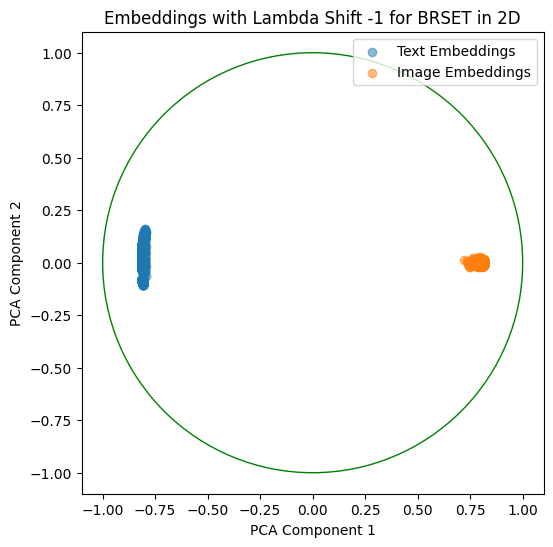

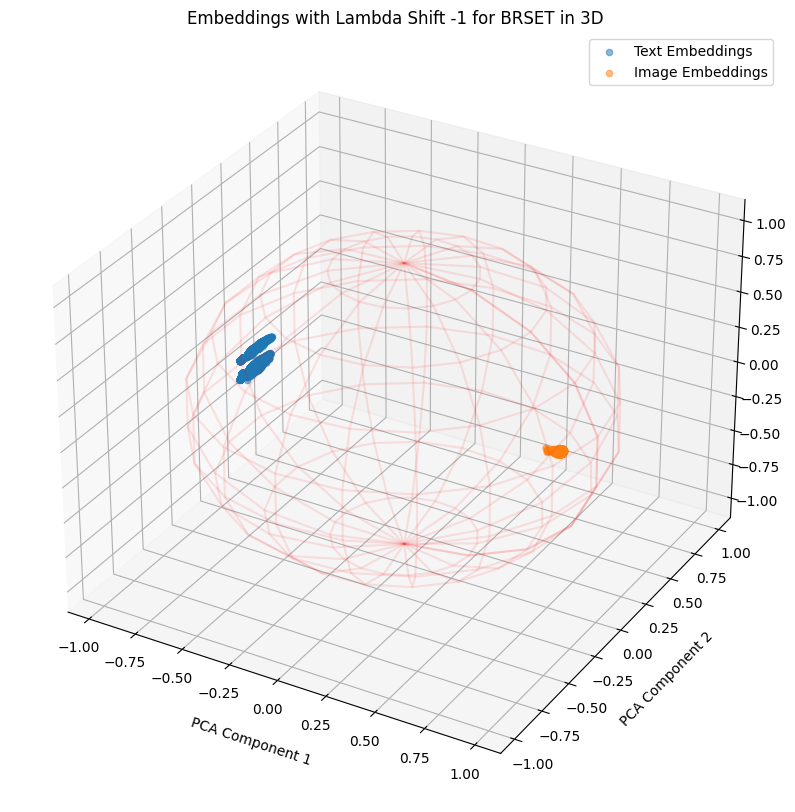

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.13 seconds
Total Training Time per Epoch: 212.70 seconds
Average Inference Time per Epoch: 0.49 seconds
Total Inference Time per Epoch: 49.13 seconds


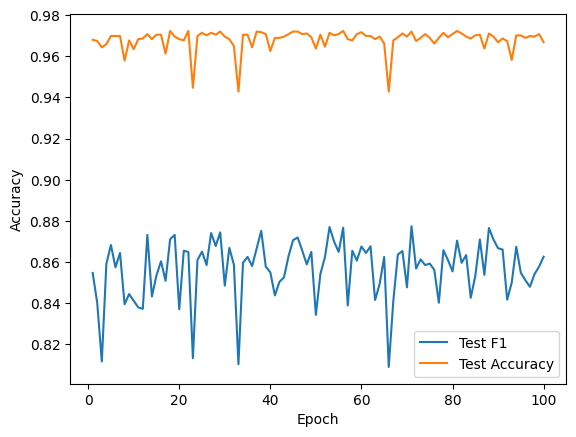

Best Accuracy: {'Acc': 0.972341733251383, 'F1': 0.8710470000792581, 'Epoch': 18}
Best Macro-F1: {'Acc': 0.9720344191763983, 'F1': 0.87736697264804, 'Epoch': 71}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.44 seconds
Total Training Time per Epoch: 243.92 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.28 seconds


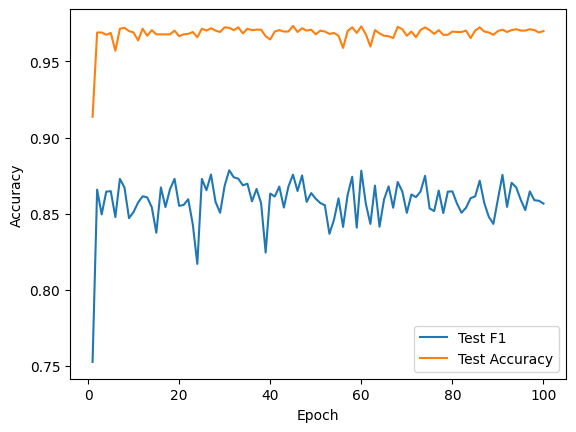

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8756611723244674, 'Epoch': 45}
Best Macro-F1: {'Acc': 0.9720344191763983, 'F1': 0.8785168847802924, 'Epoch': 31}
##################################################  Shift -0.9  ##################################################


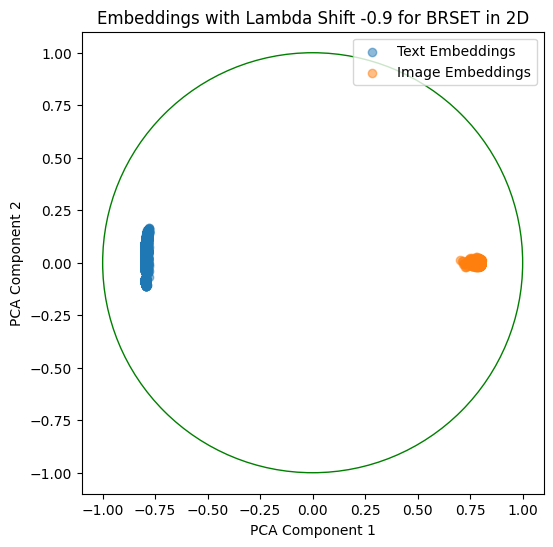

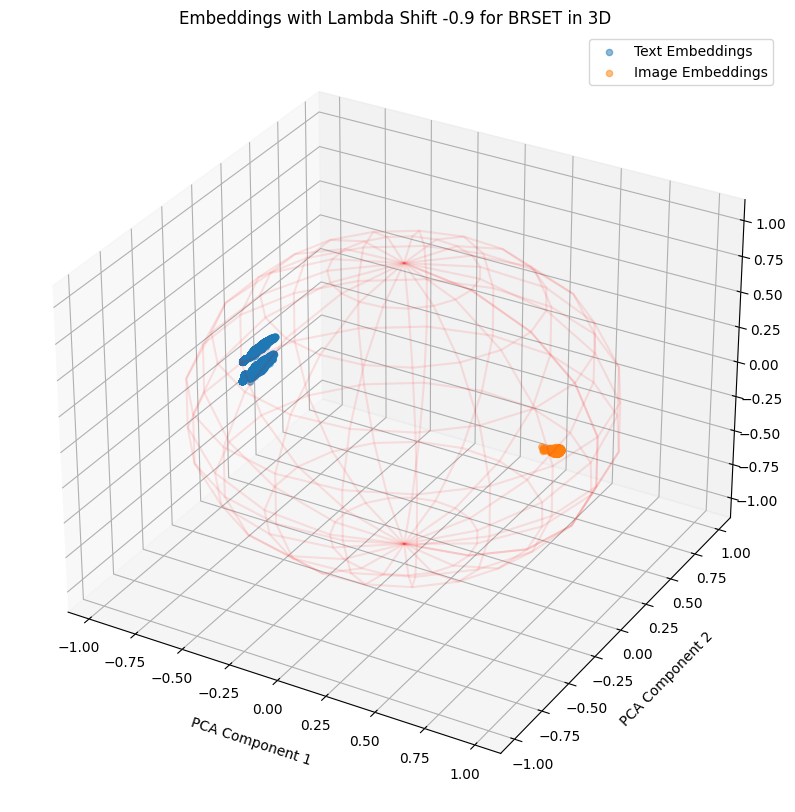

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.19 seconds
Total Training Time per Epoch: 219.32 seconds
Average Inference Time per Epoch: 0.52 seconds
Total Inference Time per Epoch: 52.00 seconds


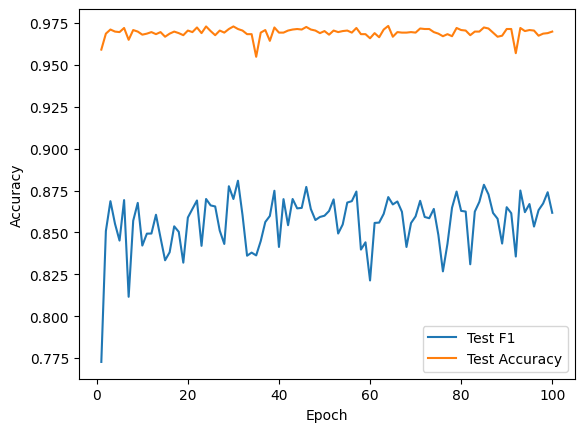

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8710792396945772, 'Epoch': 64}
Best Macro-F1: {'Acc': 0.9714197910264291, 'F1': 0.8808549942183833, 'Epoch': 31}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.47 seconds
Total Training Time per Epoch: 246.71 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.91 seconds


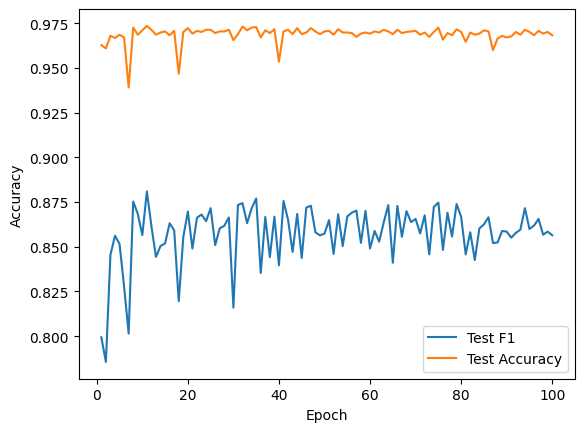

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 11}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 11}
##################################################  Shift -0.8  ##################################################


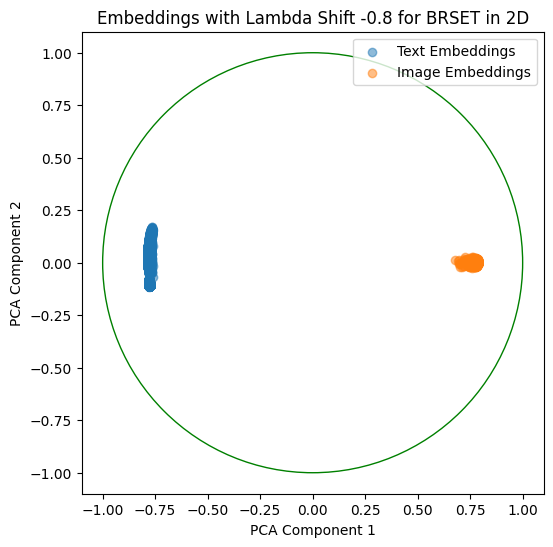

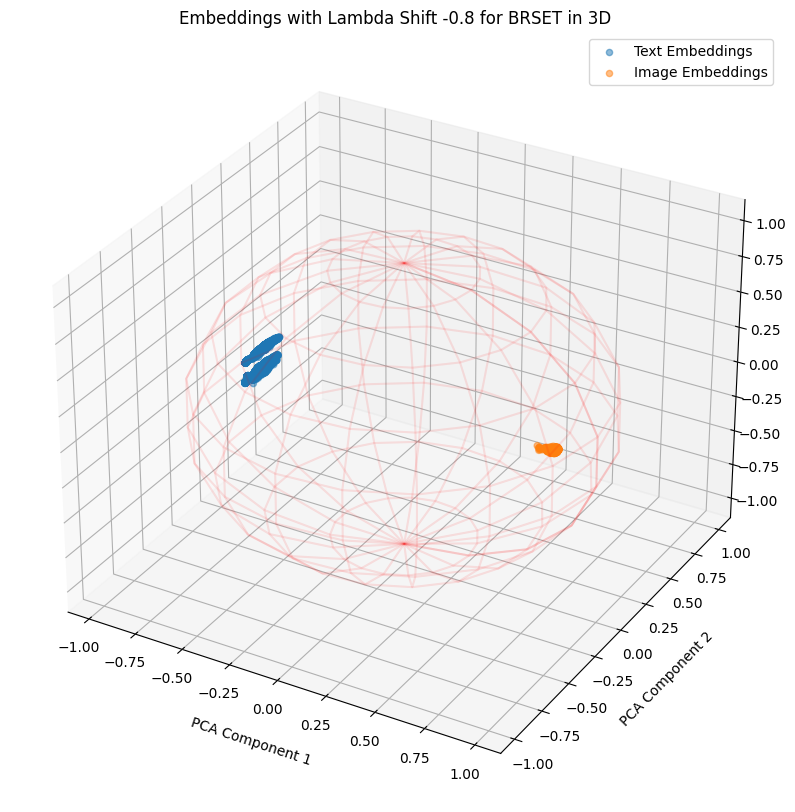

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.18 seconds
Total Training Time per Epoch: 217.60 seconds
Average Inference Time per Epoch: 0.54 seconds
Total Inference Time per Epoch: 53.77 seconds


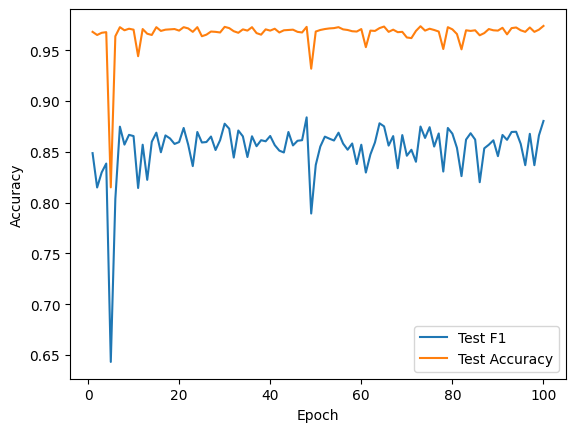

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8803359195149925, 'Epoch': 100}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8838807209685582, 'Epoch': 48}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.55 seconds
Total Training Time per Epoch: 255.43 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 60.09 seconds


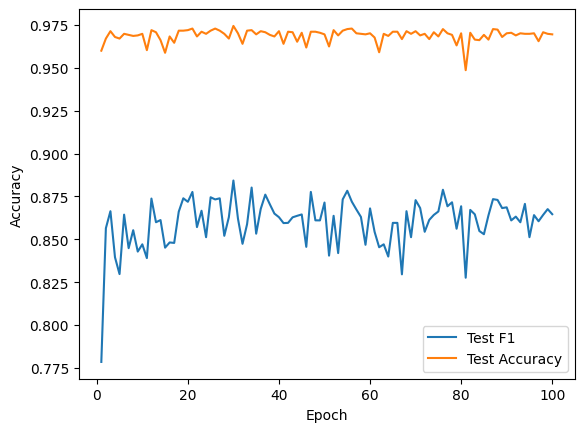

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.8843028169707936, 'Epoch': 30}
Best Macro-F1: {'Acc': 0.9744929317762754, 'F1': 0.8843028169707936, 'Epoch': 30}
##################################################  Shift -0.7  ##################################################


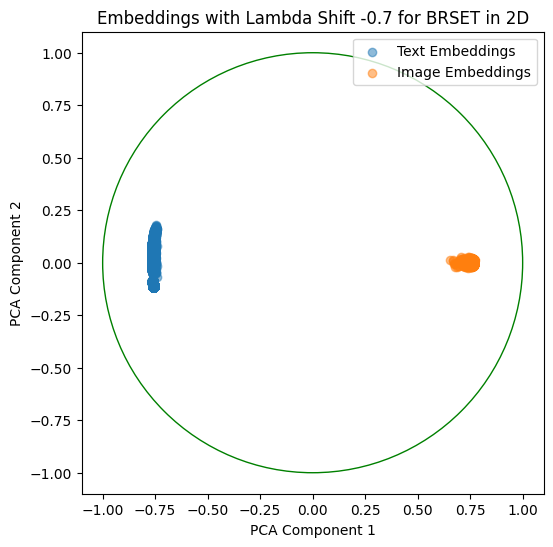

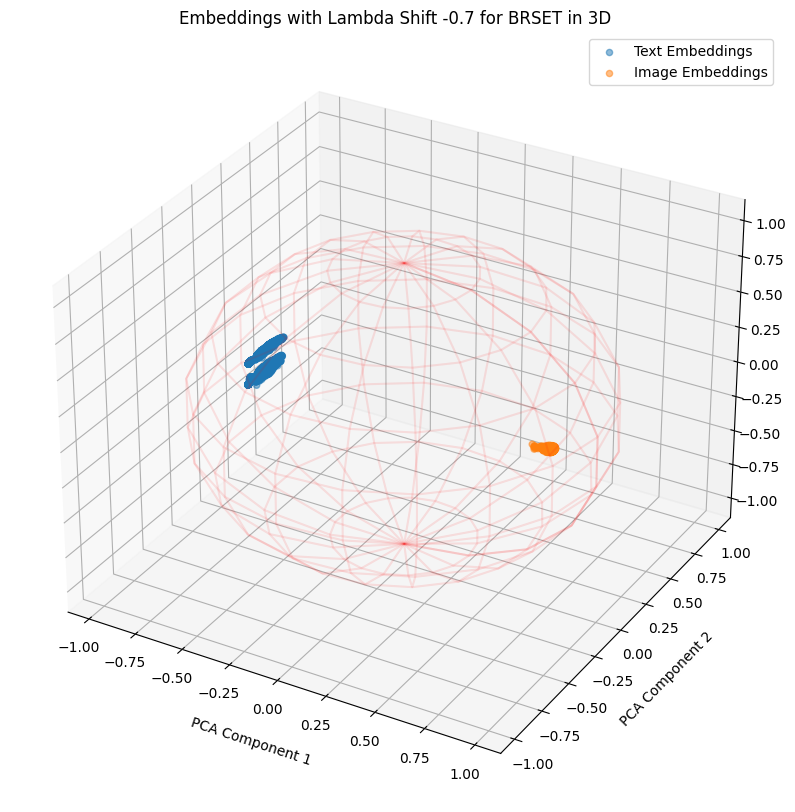

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.19 seconds
Total Training Time per Epoch: 218.52 seconds
Average Inference Time per Epoch: 0.53 seconds
Total Inference Time per Epoch: 52.74 seconds


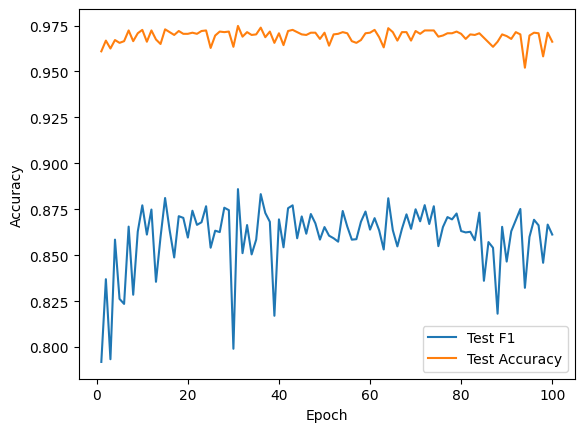

Best Accuracy: {'Acc': 0.97480024585126, 'F1': 0.88597737221661, 'Epoch': 31}
Best Macro-F1: {'Acc': 0.97480024585126, 'F1': 0.88597737221661, 'Epoch': 31}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.49 seconds
Total Training Time per Epoch: 249.25 seconds
Average Inference Time per Epoch: 0.61 seconds
Total Inference Time per Epoch: 61.18 seconds


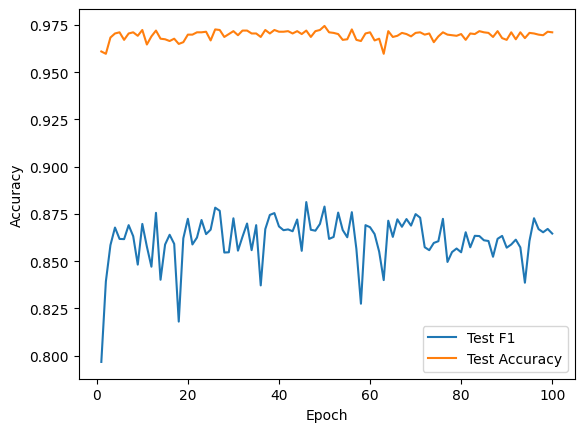

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.8789214730334636, 'Epoch': 50}
Best Macro-F1: {'Acc': 0.9720344191763983, 'F1': 0.8812928168512133, 'Epoch': 46}
##################################################  Shift -0.6  ##################################################


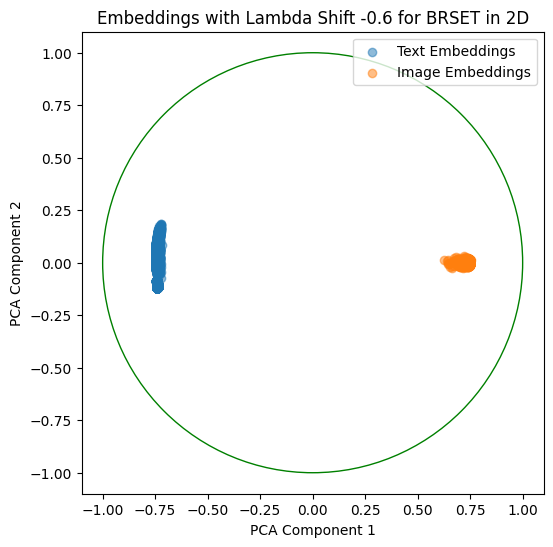

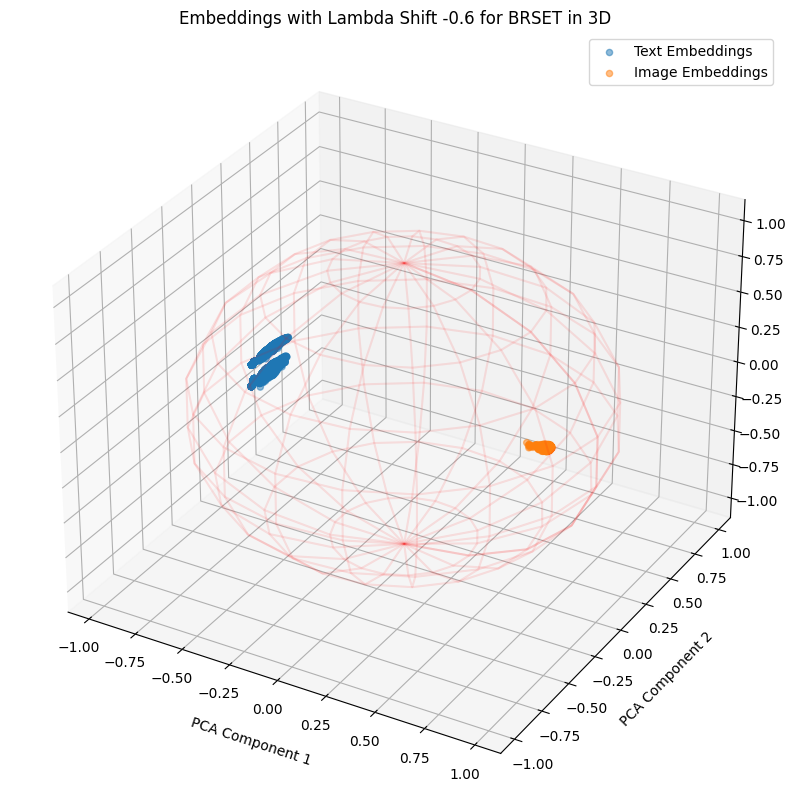

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.14 seconds
Total Training Time per Epoch: 213.52 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 54.87 seconds


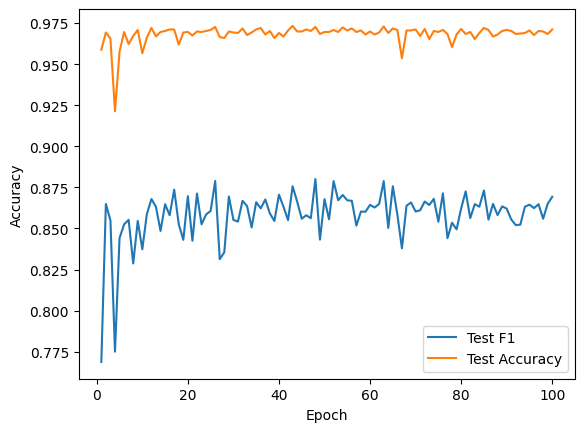

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8756611723244674, 'Epoch': 43}
Best Macro-F1: {'Acc': 0.9726490473263676, 'F1': 0.8800622040184127, 'Epoch': 48}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.52 seconds
Total Training Time per Epoch: 252.39 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.46 seconds


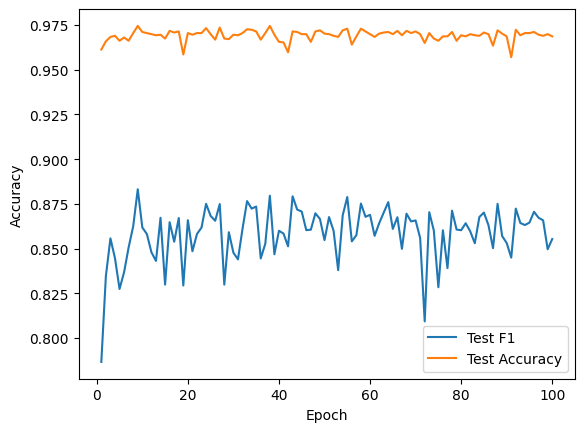

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.883151544938169, 'Epoch': 9}
Best Macro-F1: {'Acc': 0.9744929317762754, 'F1': 0.883151544938169, 'Epoch': 9}
##################################################  Shift -0.5  ##################################################


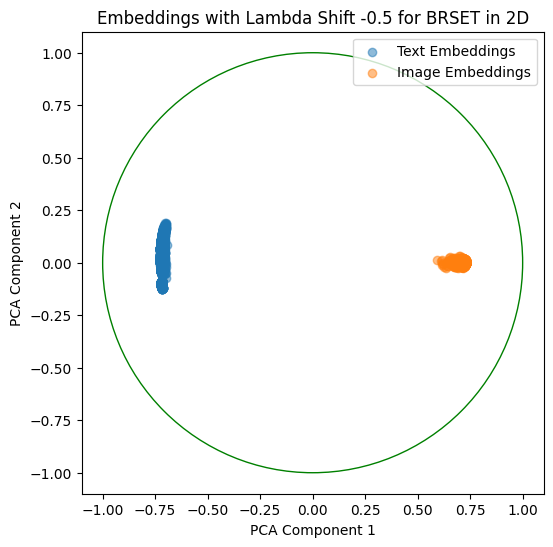

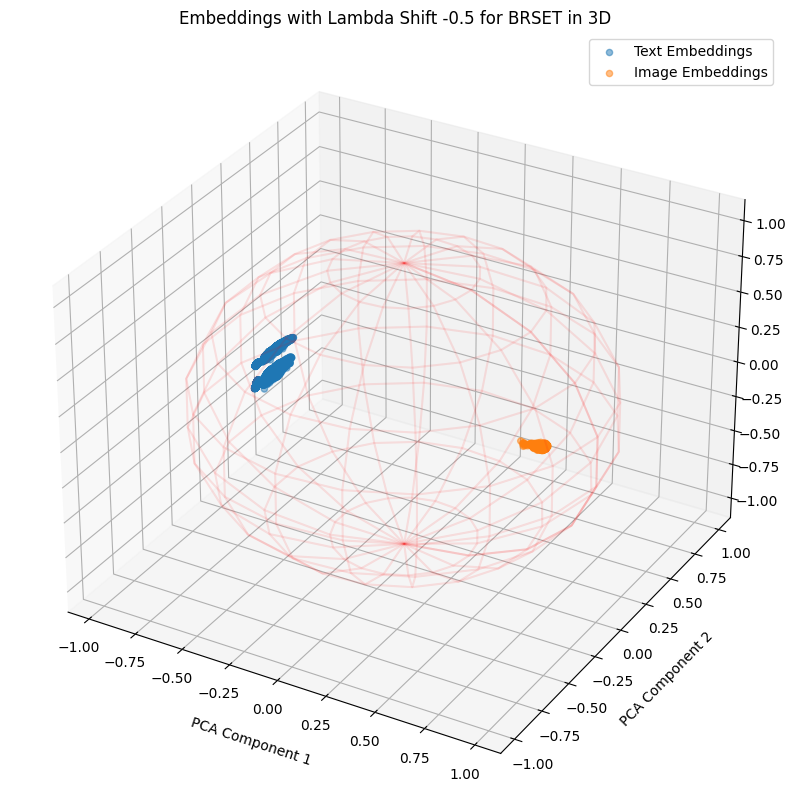

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.17 seconds
Total Training Time per Epoch: 217.00 seconds
Average Inference Time per Epoch: 0.53 seconds
Total Inference Time per Epoch: 53.49 seconds


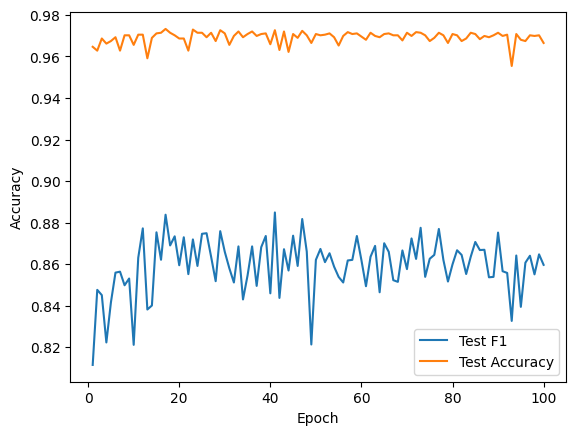

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8838568019328072, 'Epoch': 17}
Best Macro-F1: {'Acc': 0.9726490473263676, 'F1': 0.8849507495327215, 'Epoch': 41}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.52 seconds
Total Training Time per Epoch: 252.42 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.81 seconds


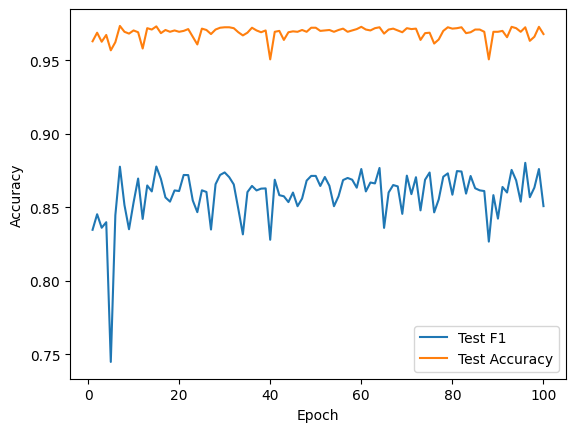

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.877520294091816, 'Epoch': 7}
Best Macro-F1: {'Acc': 0.972341733251383, 'F1': 0.8801326129666012, 'Epoch': 96}
##################################################  Shift -0.4  ##################################################


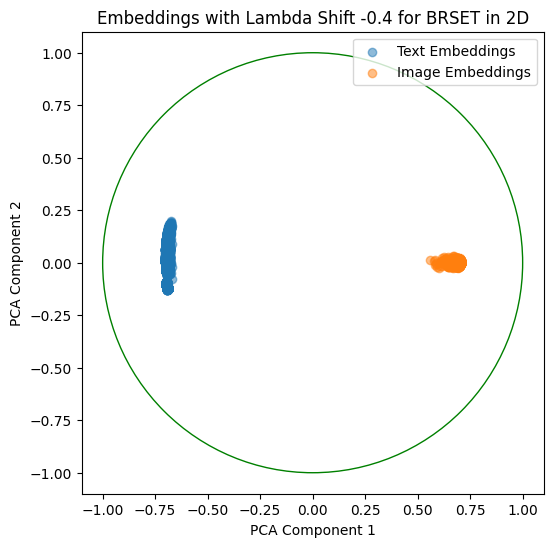

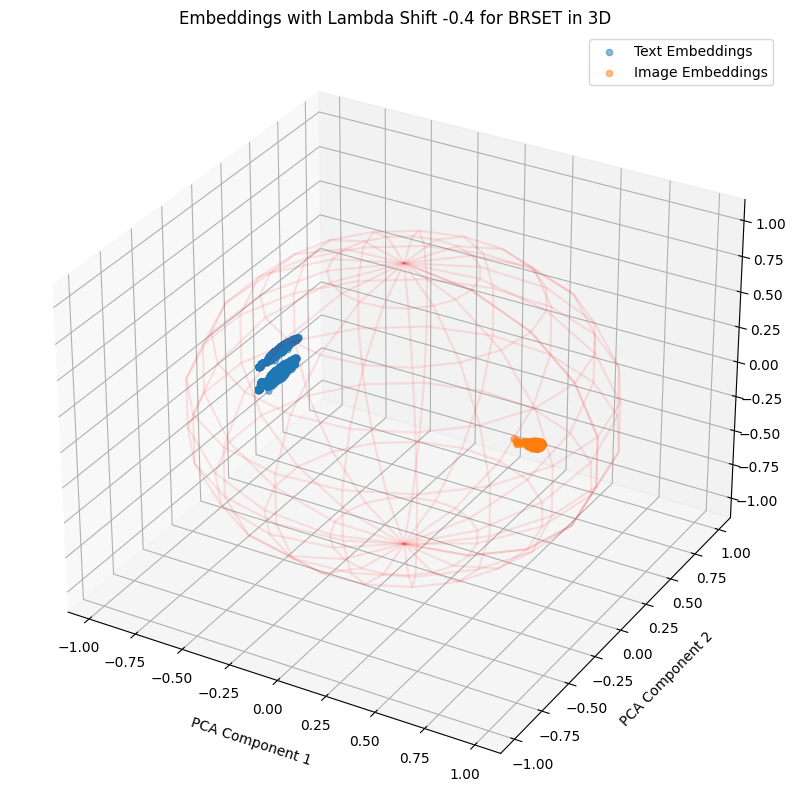

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.18 seconds
Total Training Time per Epoch: 217.87 seconds
Average Inference Time per Epoch: 0.53 seconds
Total Inference Time per Epoch: 53.37 seconds


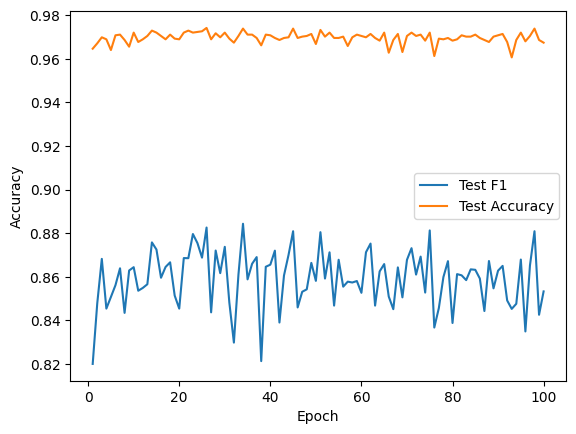

Best Accuracy: {'Acc': 0.9741856177012908, 'F1': 0.8826198983097431, 'Epoch': 26}
Best Macro-F1: {'Acc': 0.9738783036263061, 'F1': 0.8843564975726947, 'Epoch': 34}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.51 seconds
Total Training Time per Epoch: 250.61 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.30 seconds


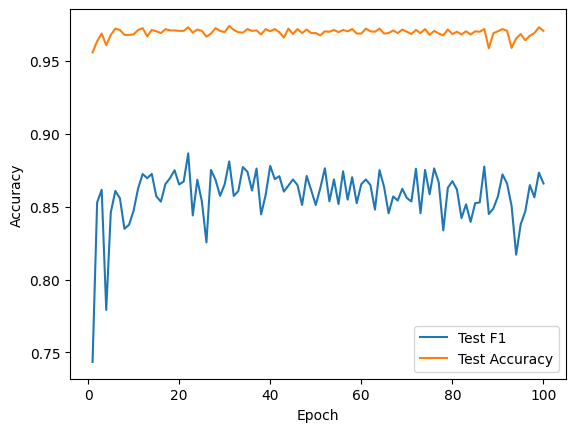

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8809285498114203, 'Epoch': 31}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8864995901567867, 'Epoch': 22}
##################################################  Shift -0.3  ##################################################


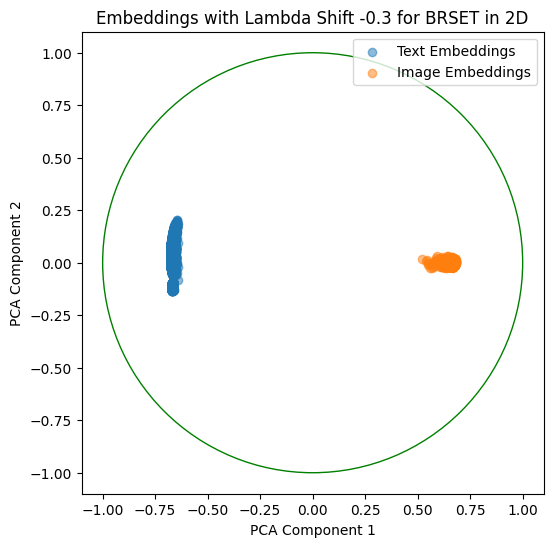

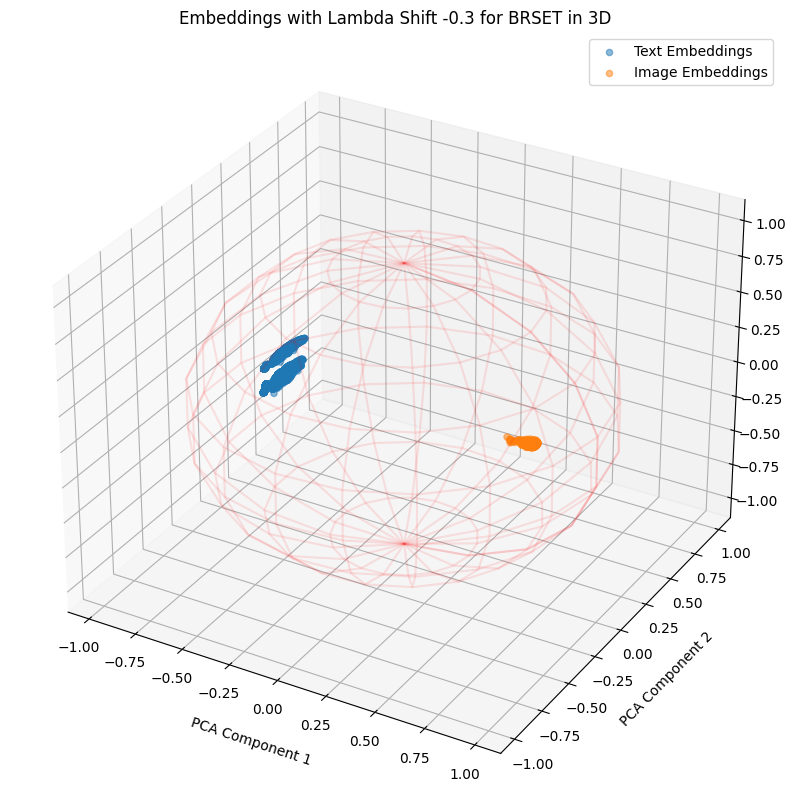

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.19 seconds
Total Training Time per Epoch: 218.59 seconds
Average Inference Time per Epoch: 0.52 seconds
Total Inference Time per Epoch: 52.27 seconds


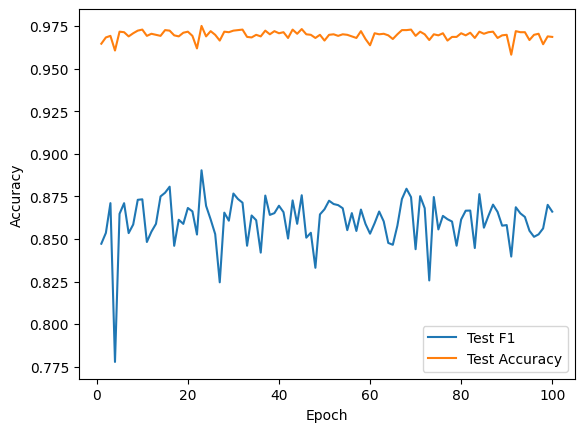

Best Accuracy: {'Acc': 0.9751075599262446, 'F1': 0.8903235068315305, 'Epoch': 23}
Best Macro-F1: {'Acc': 0.9751075599262446, 'F1': 0.8903235068315305, 'Epoch': 23}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.52 seconds
Total Training Time per Epoch: 252.10 seconds
Average Inference Time per Epoch: 0.58 seconds
Total Inference Time per Epoch: 58.46 seconds


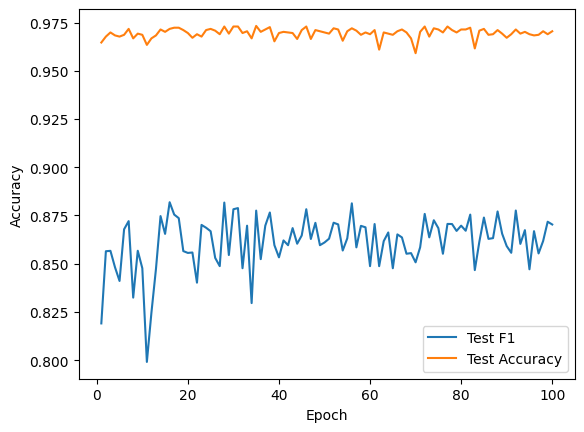

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.877520294091816, 'Epoch': 35}
Best Macro-F1: {'Acc': 0.9717271051014137, 'F1': 0.8818721905146725, 'Epoch': 16}
##################################################  Shift -0.2  ##################################################


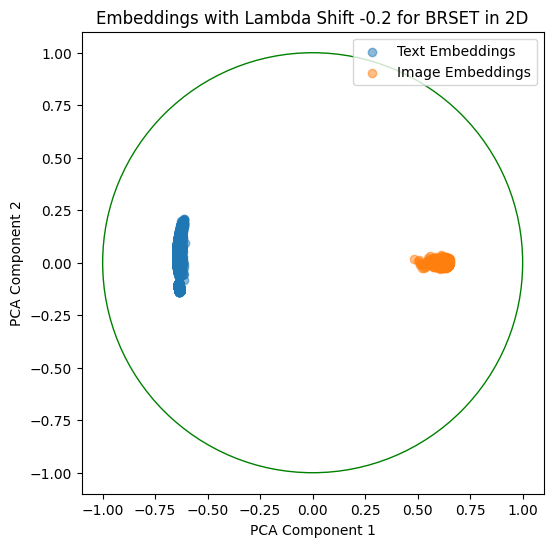

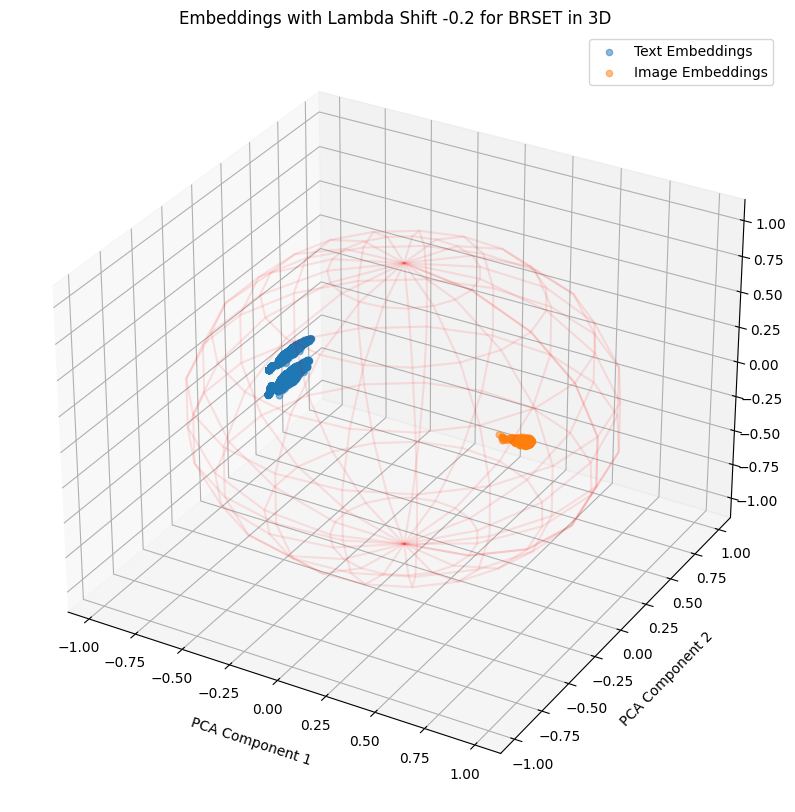

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.19 seconds
Total Training Time per Epoch: 219.02 seconds
Average Inference Time per Epoch: 0.56 seconds
Total Inference Time per Epoch: 55.60 seconds


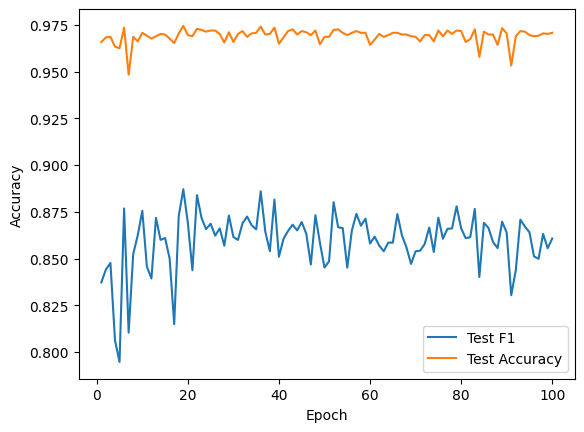

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.8870775211592197, 'Epoch': 19}
Best Macro-F1: {'Acc': 0.9744929317762754, 'F1': 0.8870775211592197, 'Epoch': 19}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.50 seconds
Total Training Time per Epoch: 249.70 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.69 seconds


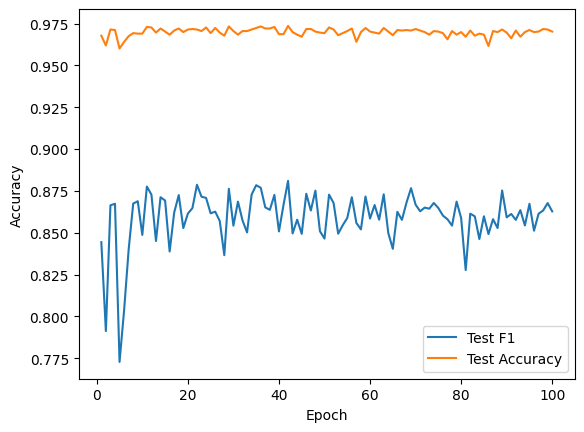

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 42}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 42}
##################################################  Shift -0.1  ##################################################


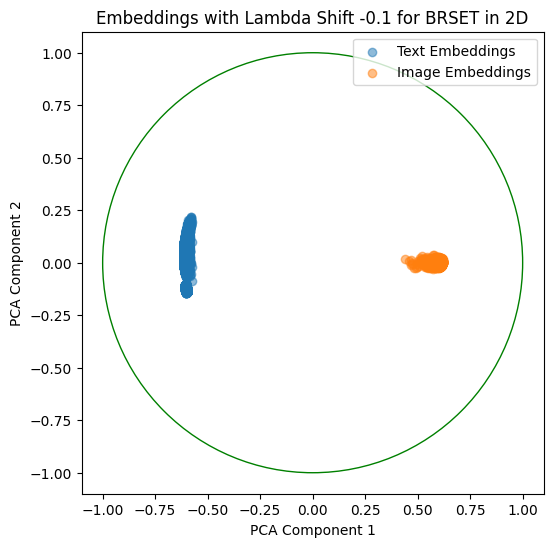

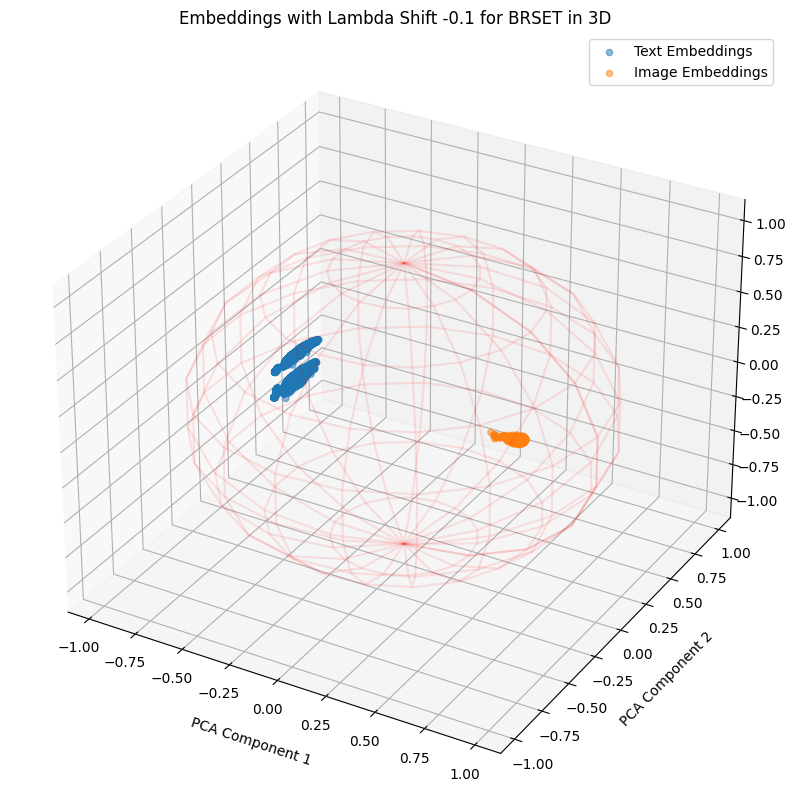

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.24 seconds
Total Training Time per Epoch: 223.60 seconds
Average Inference Time per Epoch: 0.56 seconds
Total Inference Time per Epoch: 55.53 seconds


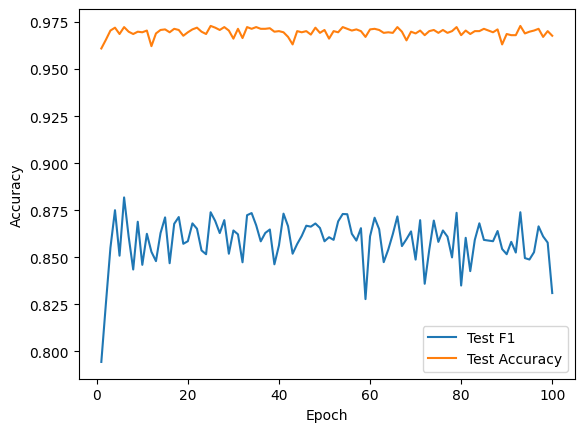

Best Accuracy: {'Acc': 0.9729563614013522, 'F1': 0.8739126222997191, 'Epoch': 25}
Best Macro-F1: {'Acc': 0.972341733251383, 'F1': 0.8817879303079181, 'Epoch': 6}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.53 seconds
Total Training Time per Epoch: 253.33 seconds
Average Inference Time per Epoch: 0.63 seconds
Total Inference Time per Epoch: 63.07 seconds


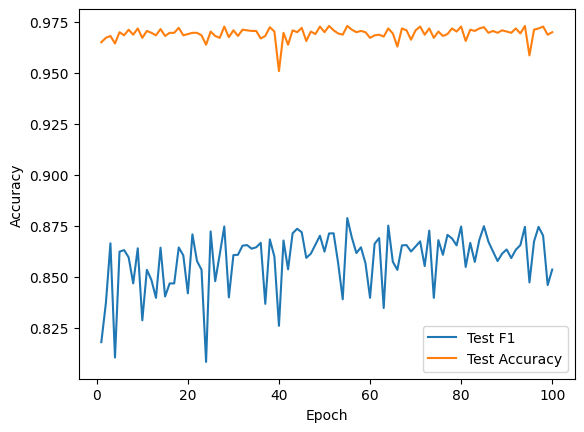

Best Accuracy: {'Acc': 0.9729563614013522, 'F1': 0.8712939107859758, 'Epoch': 51}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8788231689667605, 'Epoch': 55}
##################################################  Shift 0  ##################################################


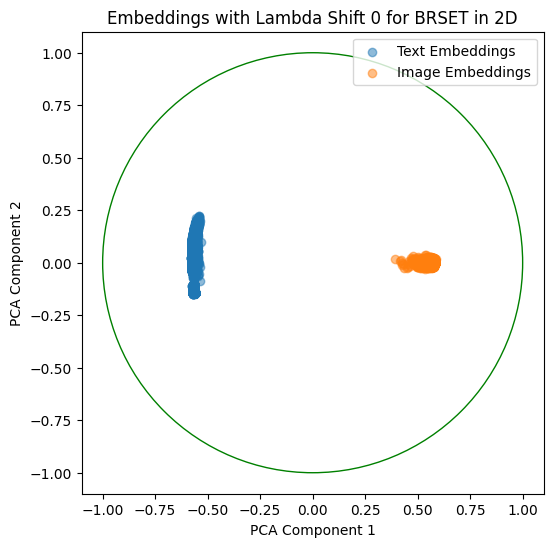

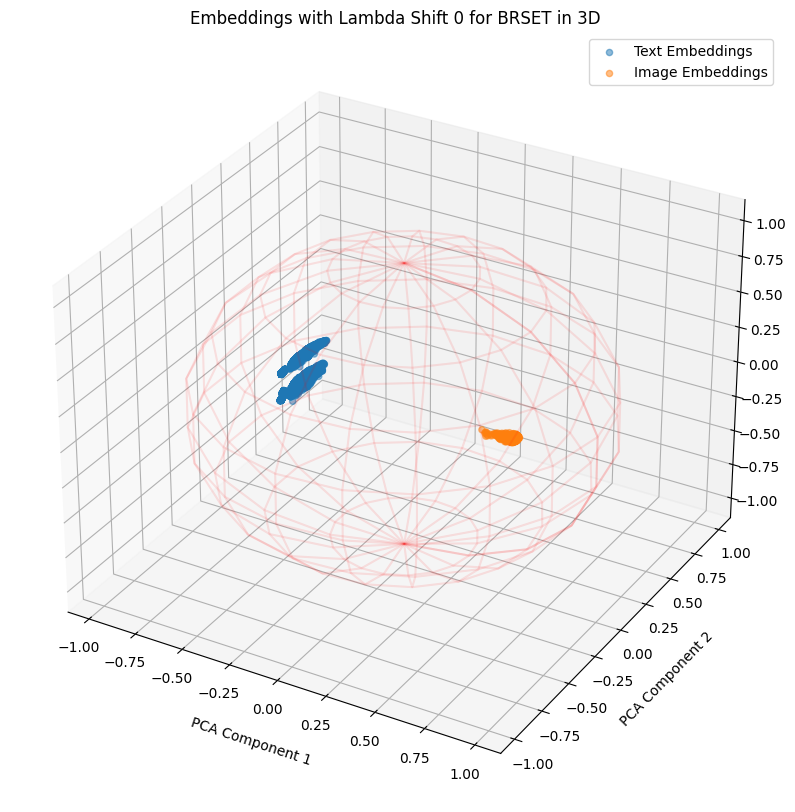

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.14 seconds
Total Training Time per Epoch: 213.56 seconds
Average Inference Time per Epoch: 0.57 seconds
Total Inference Time per Epoch: 56.84 seconds


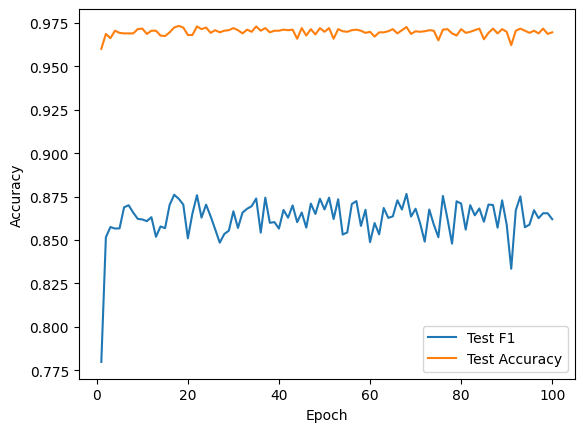

Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.873740687139165, 'Epoch': 18}
Best Macro-F1: {'Acc': 0.9726490473263676, 'F1': 0.8765467043214152, 'Epoch': 68}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.44 seconds
Total Training Time per Epoch: 244.35 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 60.33 seconds


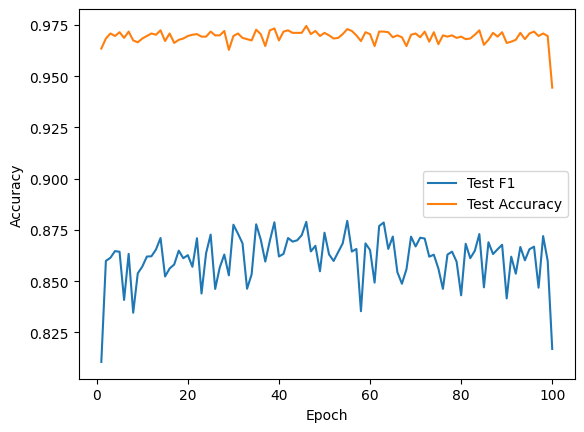

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.8789214730334636, 'Epoch': 46}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8794083956606698, 'Epoch': 55}
##################################################  Shift 0.1  ##################################################


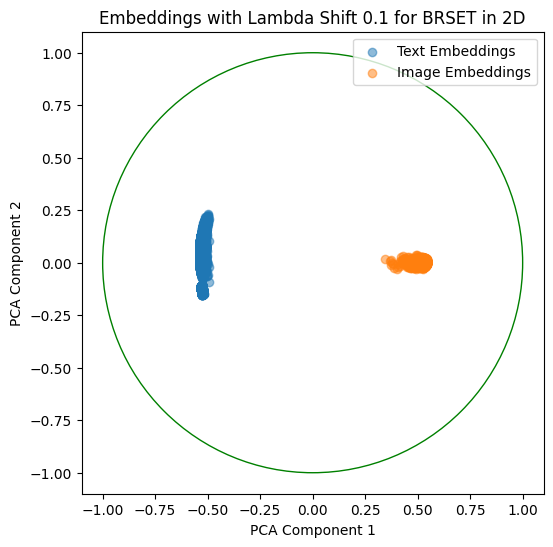

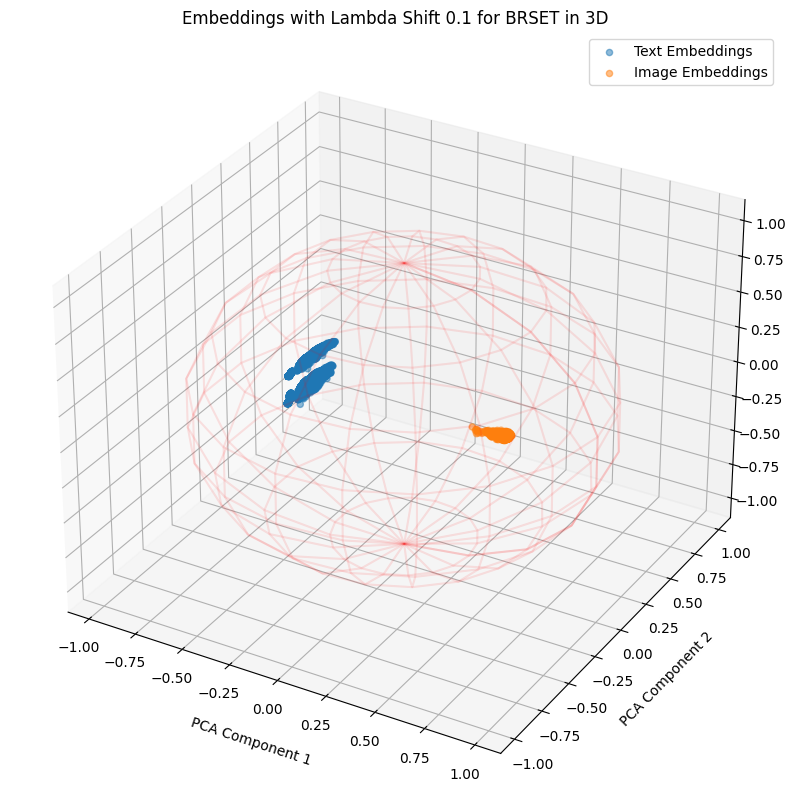

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.15 seconds
Total Training Time per Epoch: 214.95 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 55.29 seconds


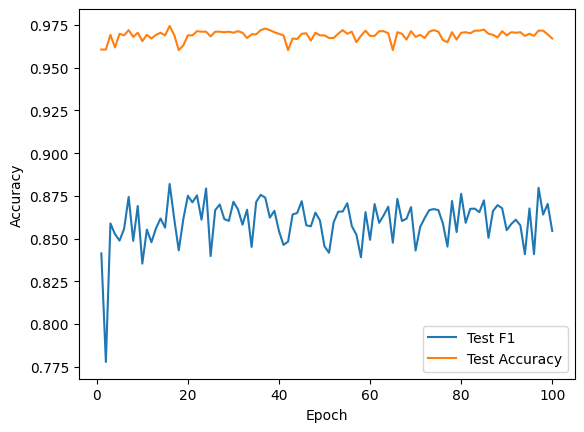

Best Accuracy: {'Acc': 0.9744929317762754, 'F1': 0.8819754802030279, 'Epoch': 16}
Best Macro-F1: {'Acc': 0.9744929317762754, 'F1': 0.8819754802030279, 'Epoch': 16}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.47 seconds
Total Training Time per Epoch: 247.10 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 59.90 seconds


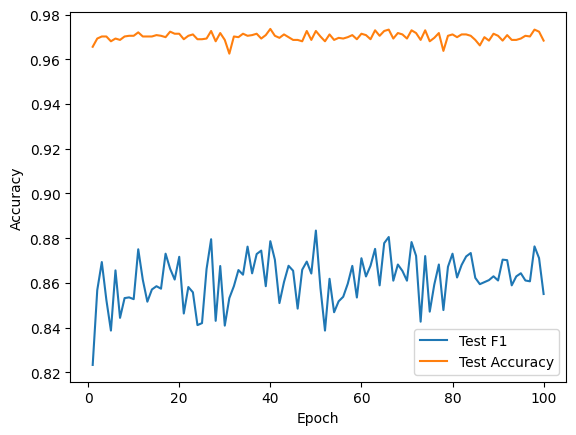

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.878625903873645, 'Epoch': 40}
Best Macro-F1: {'Acc': 0.9726490473263676, 'F1': 0.8833695044152347, 'Epoch': 50}
##################################################  Shift 0.2  ##################################################


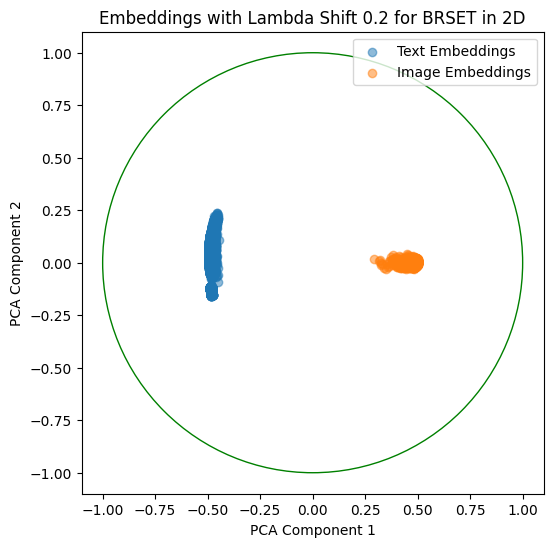

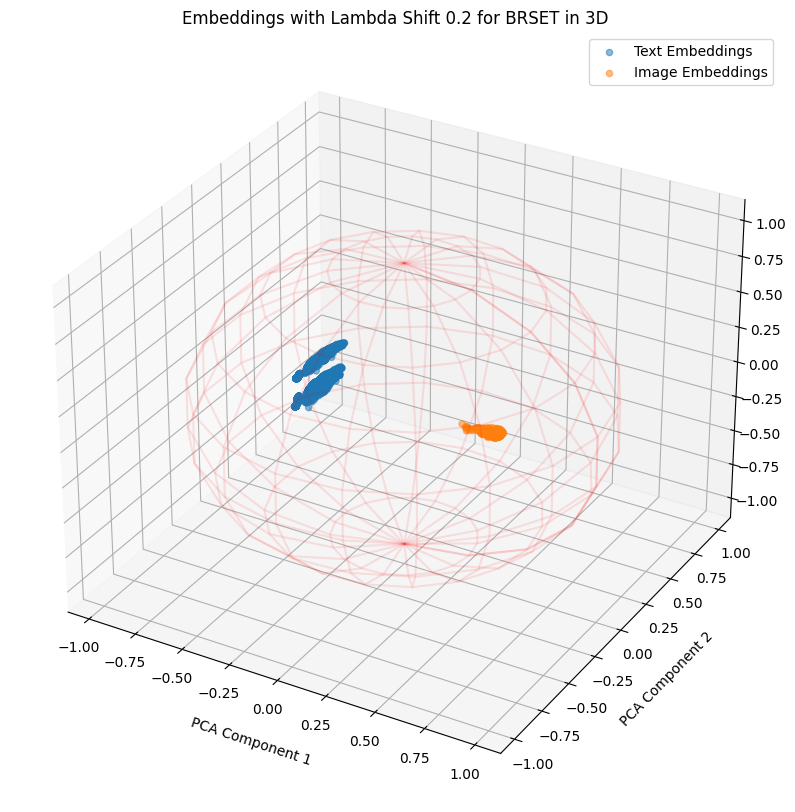

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.21 seconds
Total Training Time per Epoch: 220.55 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 54.83 seconds


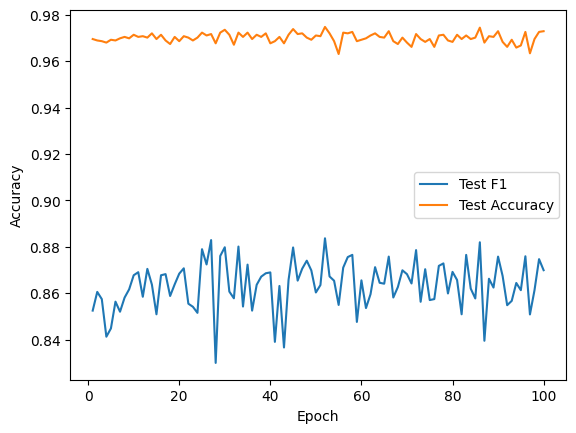

Best Accuracy: {'Acc': 0.97480024585126, 'F1': 0.8836902754699414, 'Epoch': 52}
Best Macro-F1: {'Acc': 0.97480024585126, 'F1': 0.8836902754699414, 'Epoch': 52}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.48 seconds
Total Training Time per Epoch: 247.51 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 60.11 seconds


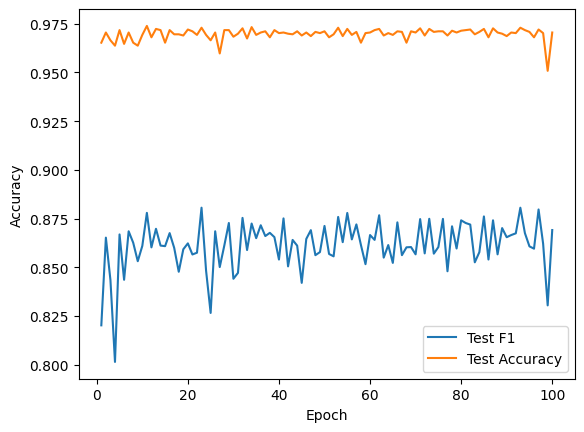

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8779008966176972, 'Epoch': 11}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8805608574364998, 'Epoch': 23}
##################################################  Shift 0.3  ##################################################


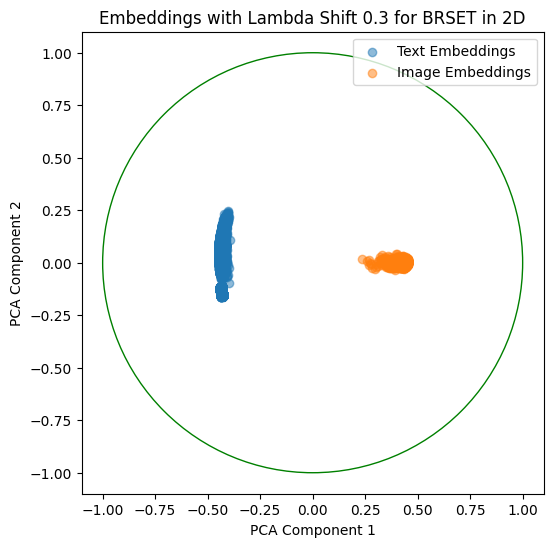

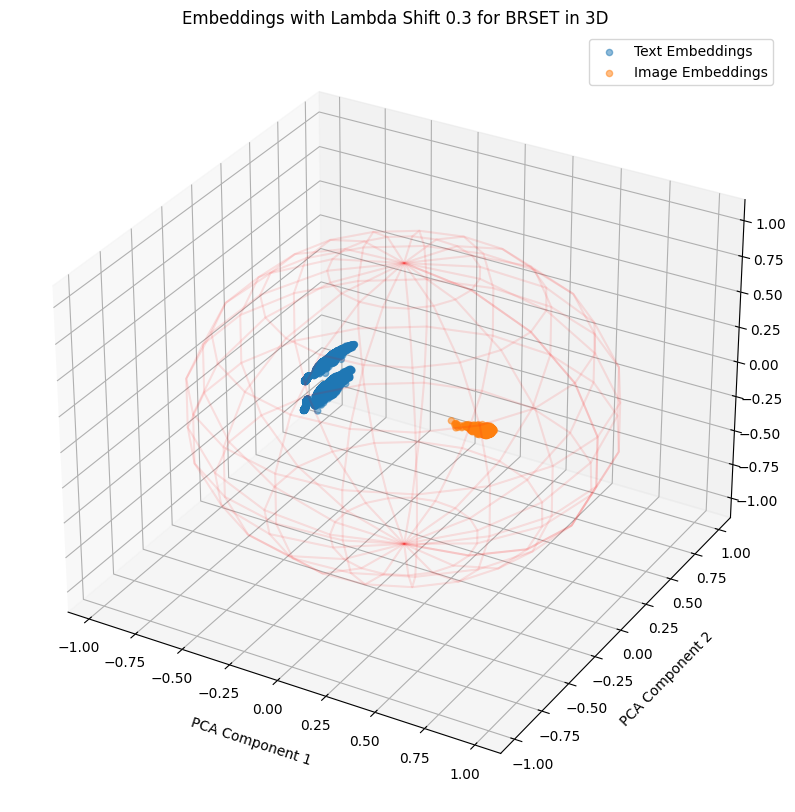

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.15 seconds
Total Training Time per Epoch: 215.08 seconds
Average Inference Time per Epoch: 0.54 seconds
Total Inference Time per Epoch: 53.88 seconds


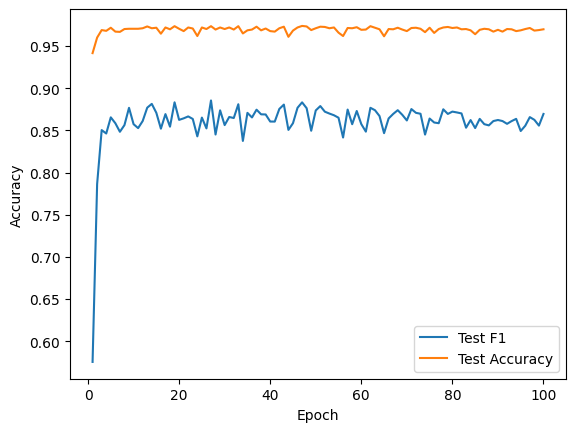

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8832375686362912, 'Epoch': 47}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.8854600523903078, 'Epoch': 27}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.48 seconds
Total Training Time per Epoch: 247.67 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.82 seconds


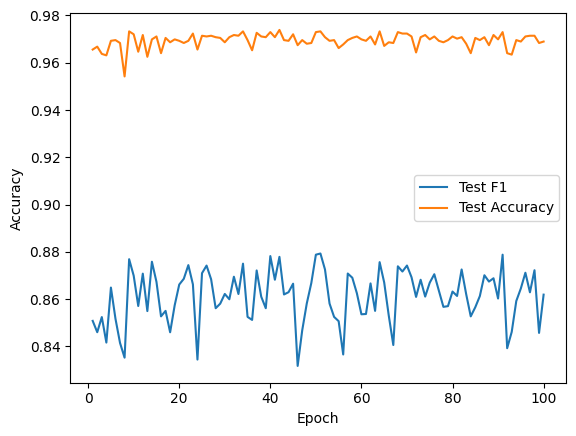

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8779008966176972, 'Epoch': 42}
Best Macro-F1: {'Acc': 0.9732636754763369, 'F1': 0.8793209356849789, 'Epoch': 51}
##################################################  Shift 0.4  ##################################################


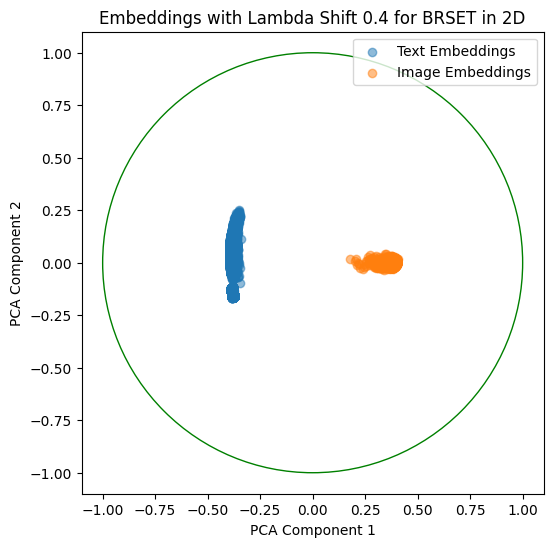

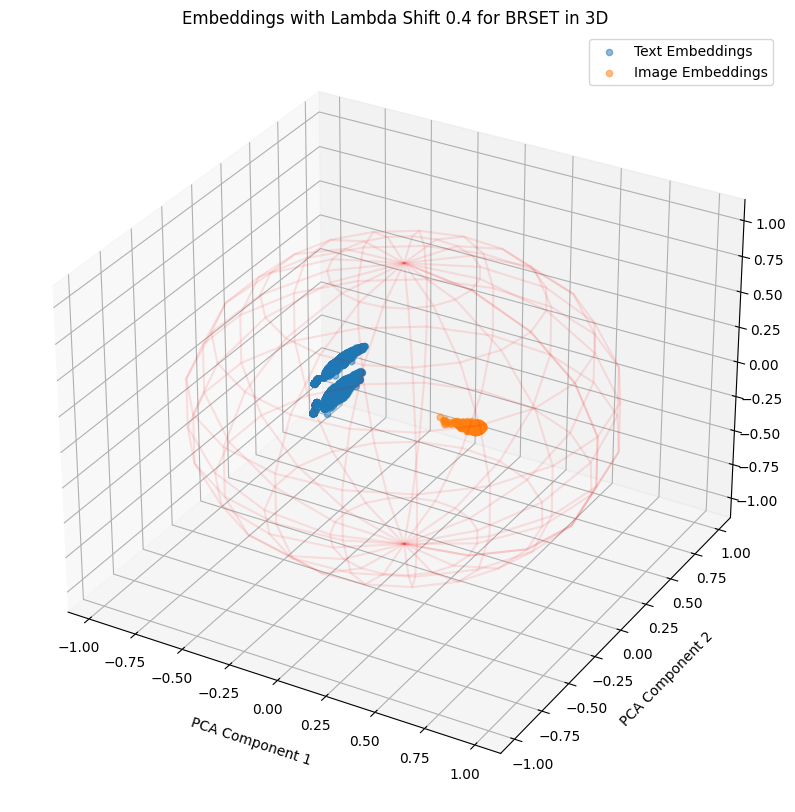

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.29 seconds
Total Training Time per Epoch: 229.04 seconds
Average Inference Time per Epoch: 0.54 seconds
Total Inference Time per Epoch: 54.48 seconds


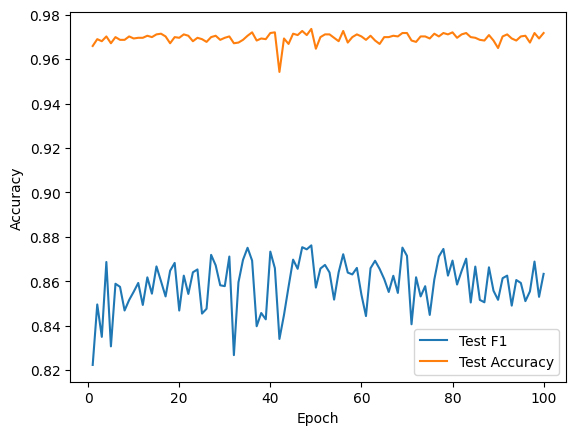

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8761489165840533, 'Epoch': 49}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.8761489165840533, 'Epoch': 49}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.68 seconds
Total Training Time per Epoch: 268.37 seconds
Average Inference Time per Epoch: 0.70 seconds
Total Inference Time per Epoch: 69.57 seconds


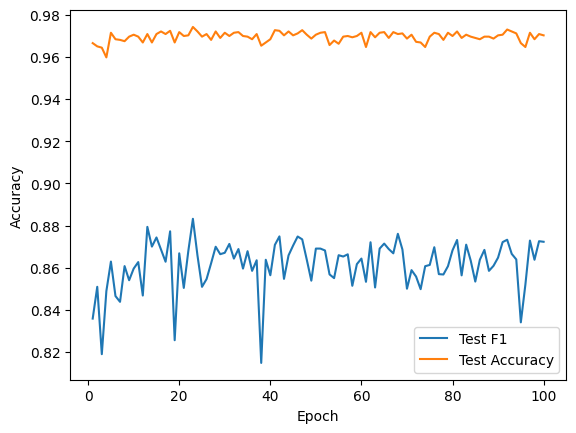

Best Accuracy: {'Acc': 0.9741856177012908, 'F1': 0.8831963325145761, 'Epoch': 23}
Best Macro-F1: {'Acc': 0.9741856177012908, 'F1': 0.8831963325145761, 'Epoch': 23}
##################################################  Shift 0.5  ##################################################


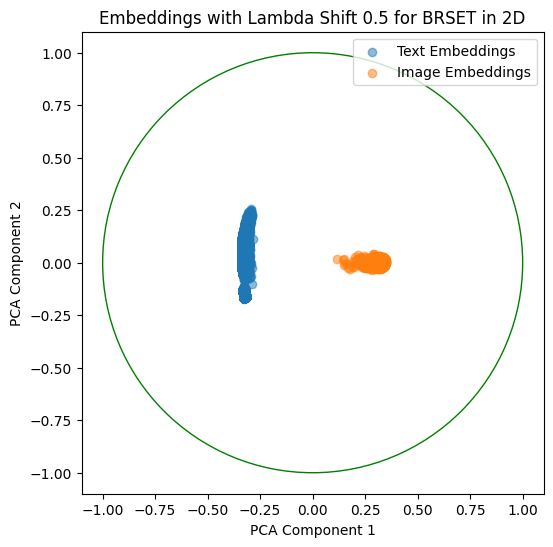

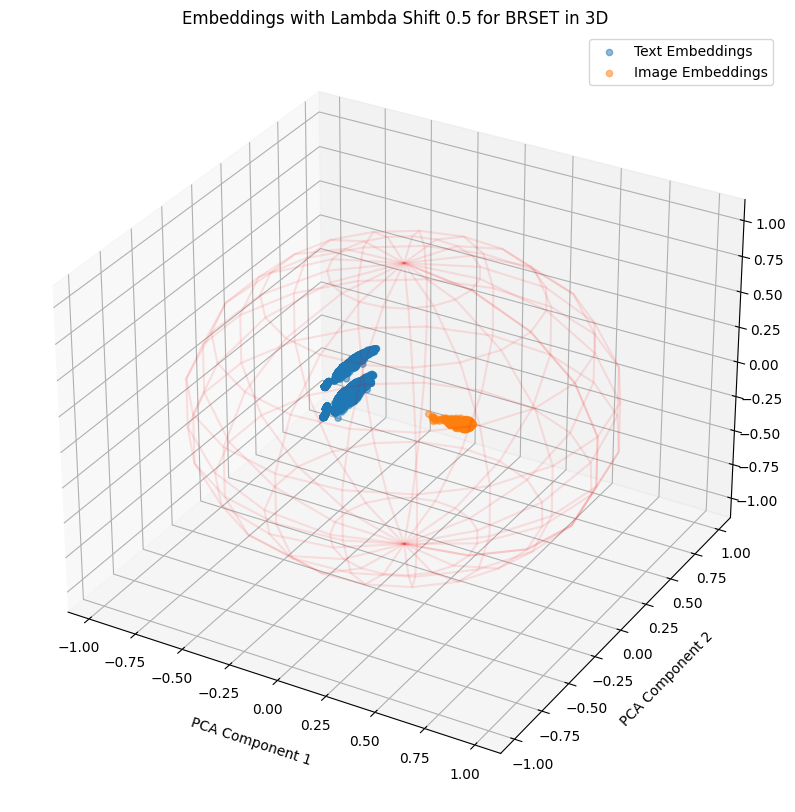

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.45 seconds
Total Training Time per Epoch: 244.68 seconds
Average Inference Time per Epoch: 0.67 seconds
Total Inference Time per Epoch: 66.79 seconds


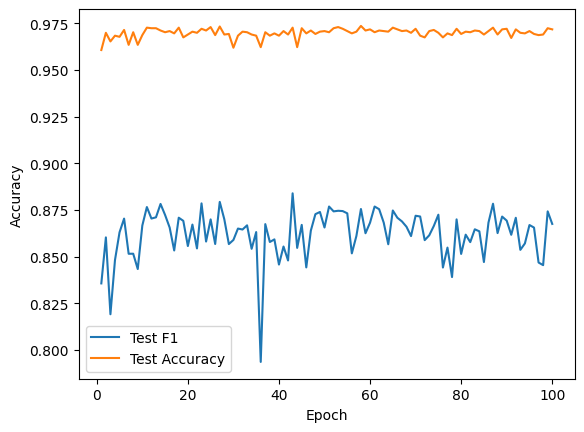

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8755126843216909, 'Epoch': 58}
Best Macro-F1: {'Acc': 0.9726490473263676, 'F1': 0.8839017659314063, 'Epoch': 43}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.70 seconds
Total Training Time per Epoch: 270.46 seconds
Average Inference Time per Epoch: 0.71 seconds
Total Inference Time per Epoch: 71.48 seconds


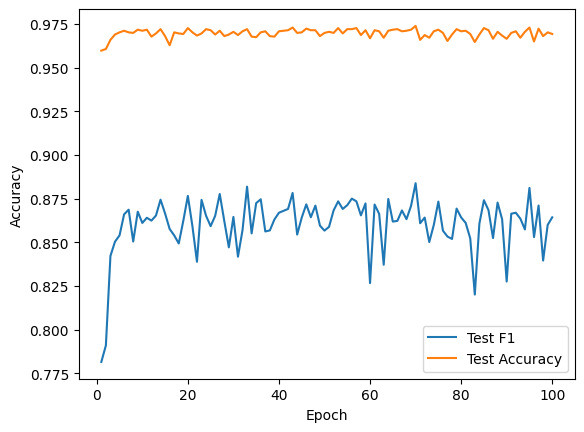

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8837999219423172, 'Epoch': 70}
Best Macro-F1: {'Acc': 0.9738783036263061, 'F1': 0.8837999219423172, 'Epoch': 70}
##################################################  Shift 0.6  ##################################################


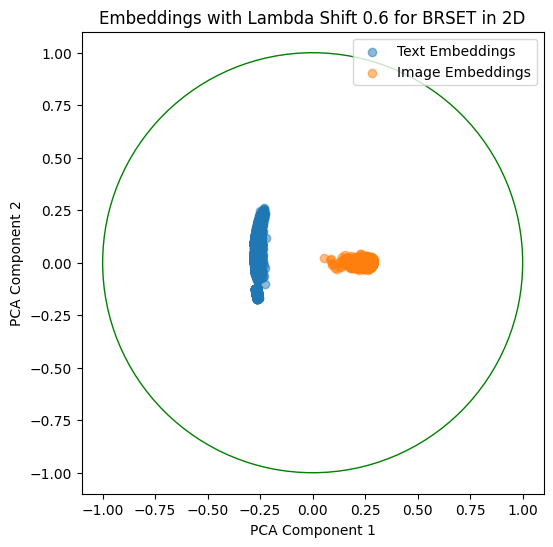

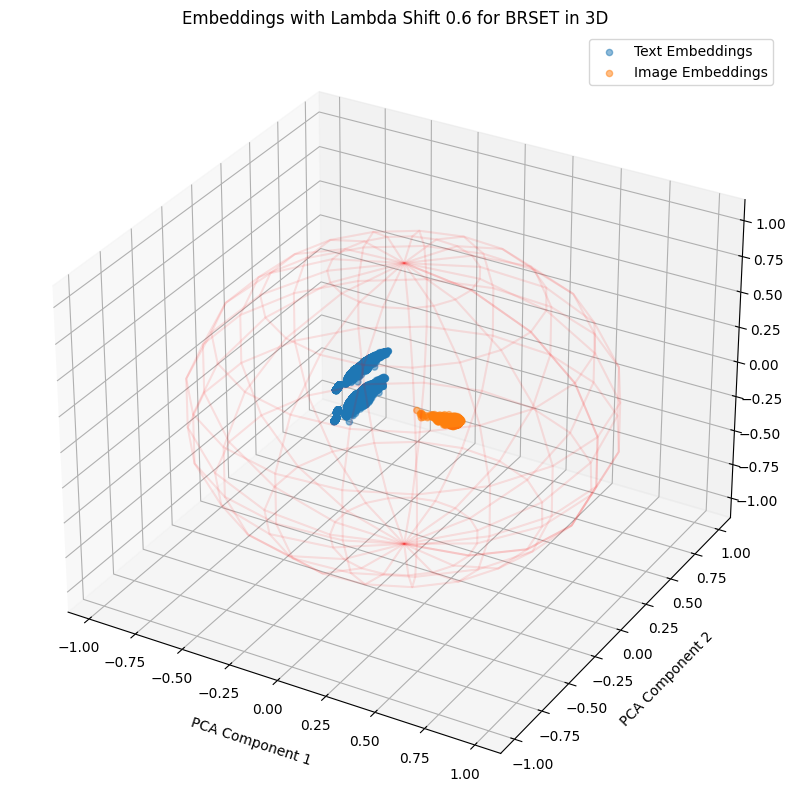

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.40 seconds
Total Training Time per Epoch: 239.81 seconds
Average Inference Time per Epoch: 0.57 seconds
Total Inference Time per Epoch: 57.05 seconds


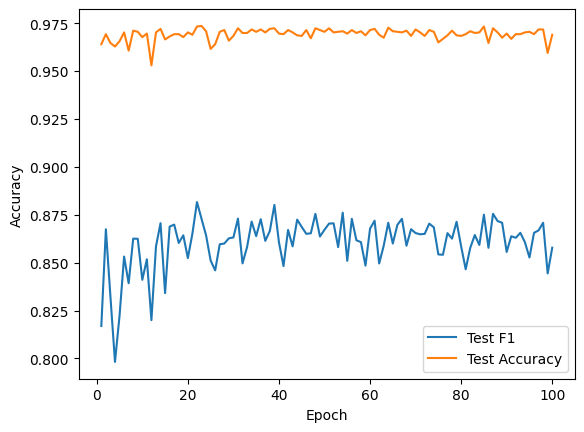

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8728963982377254, 'Epoch': 23}
Best Macro-F1: {'Acc': 0.9732636754763369, 'F1': 0.88163547398617, 'Epoch': 22}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.49 seconds
Total Training Time per Epoch: 248.96 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 59.09 seconds


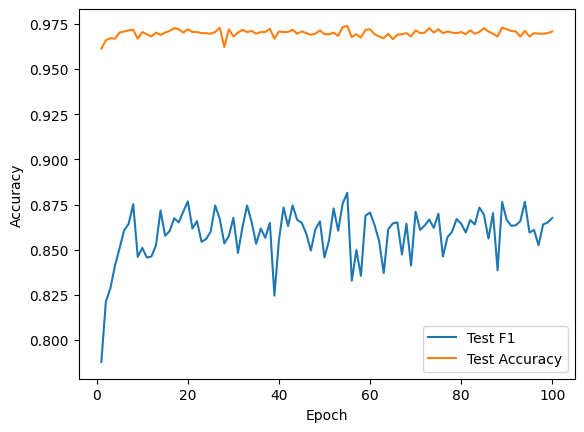

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.881514933042379, 'Epoch': 55}
Best Macro-F1: {'Acc': 0.9738783036263061, 'F1': 0.881514933042379, 'Epoch': 55}
##################################################  Shift 0.7  ##################################################


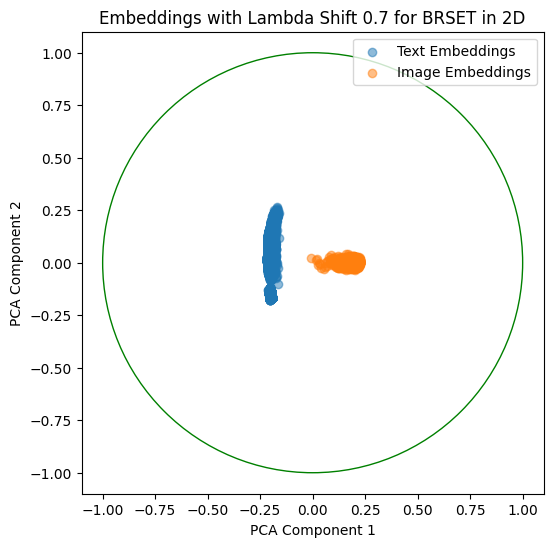

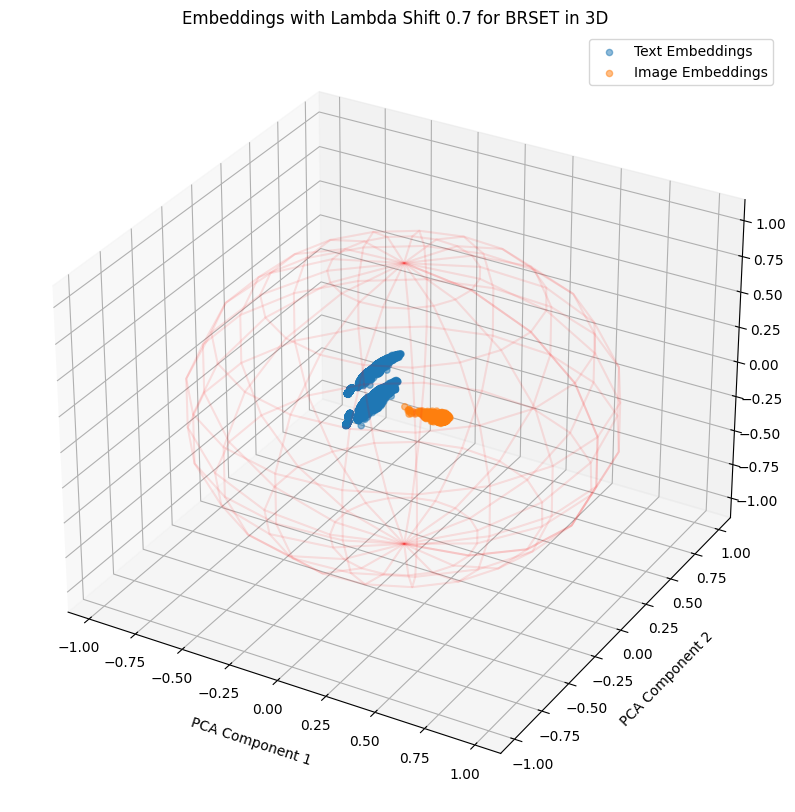

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.18 seconds
Total Training Time per Epoch: 218.02 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 55.48 seconds


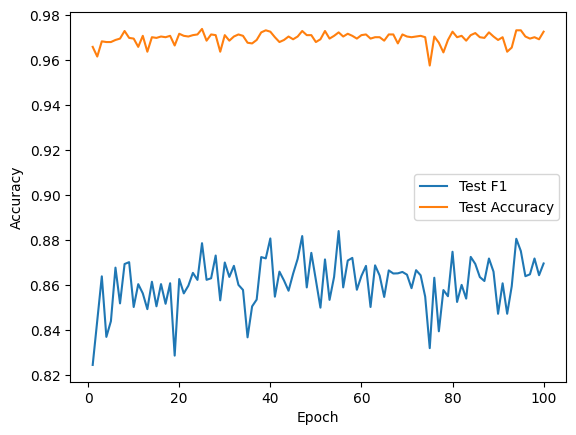

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8785195361790772, 'Epoch': 25}
Best Macro-F1: {'Acc': 0.972341733251383, 'F1': 0.8839200353876229, 'Epoch': 55}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 3.66 seconds
Total Training Time per Epoch: 366.03 seconds
Average Inference Time per Epoch: 1.07 seconds
Total Inference Time per Epoch: 107.06 seconds


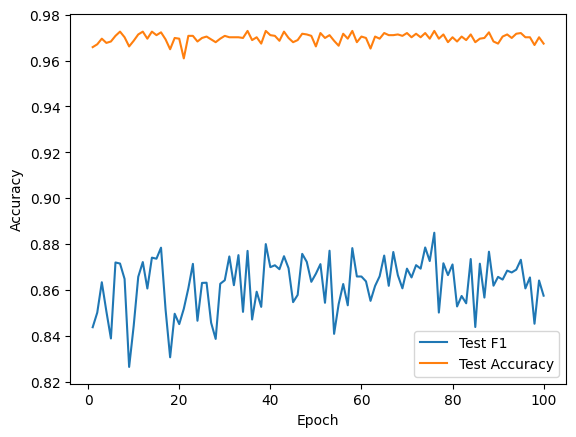

Best Accuracy: {'Acc': 0.9729563614013522, 'F1': 0.8770303696578261, 'Epoch': 35}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8849437479909996, 'Epoch': 76}
##################################################  Shift 0.8  ##################################################


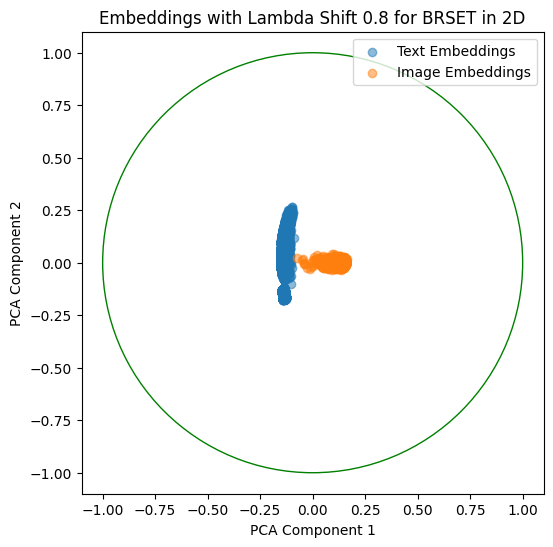

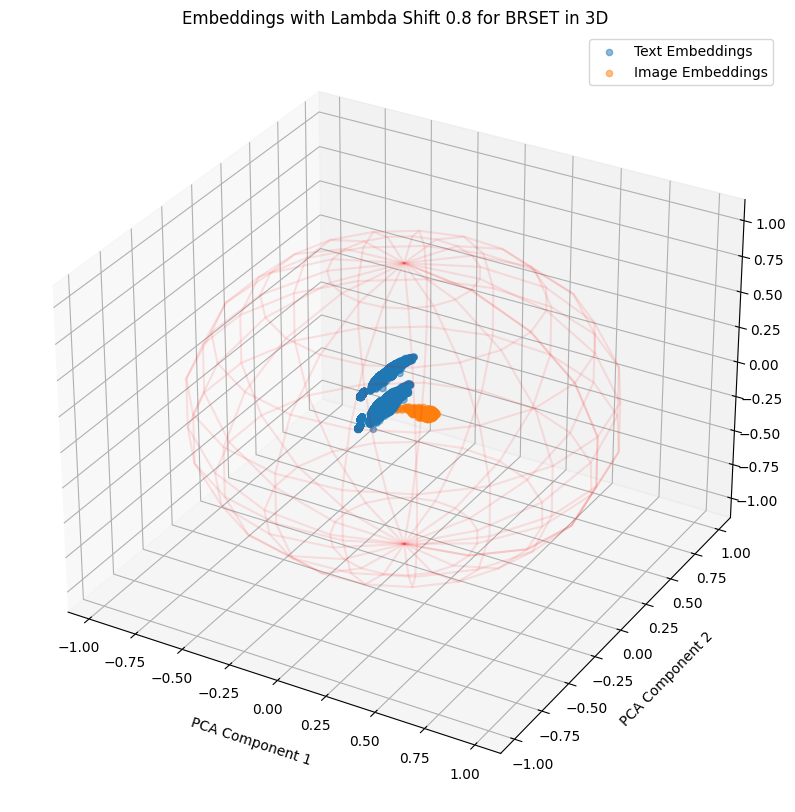

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.38 seconds
Total Training Time per Epoch: 237.60 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 54.84 seconds


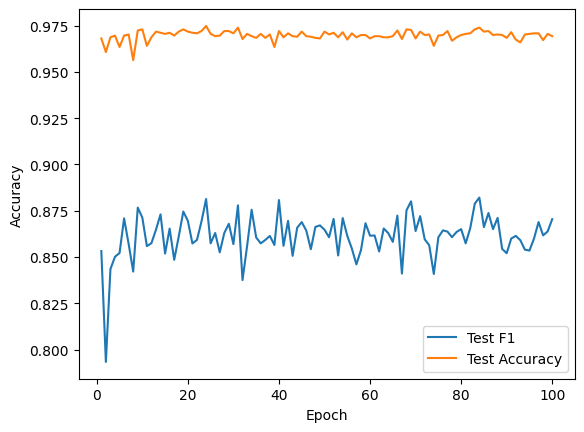

Best Accuracy: {'Acc': 0.97480024585126, 'F1': 0.8813027920276586, 'Epoch': 24}
Best Macro-F1: {'Acc': 0.9738783036263061, 'F1': 0.8820951670485426, 'Epoch': 84}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.54 seconds
Total Training Time per Epoch: 253.68 seconds
Average Inference Time per Epoch: 0.59 seconds
Total Inference Time per Epoch: 58.65 seconds


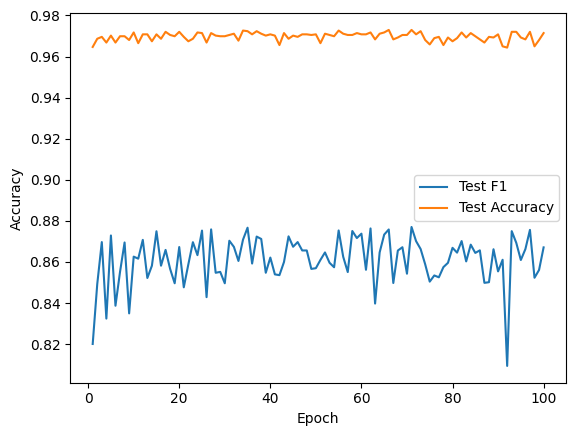

Best Accuracy: {'Acc': 0.9729563614013522, 'F1': 0.8758032504753577, 'Epoch': 66}
Best Macro-F1: {'Acc': 0.9729563614013522, 'F1': 0.8770303696578261, 'Epoch': 71}
##################################################  Shift 0.9  ##################################################


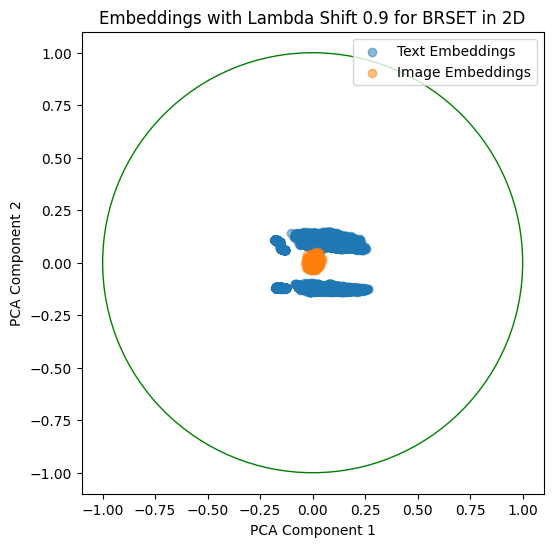

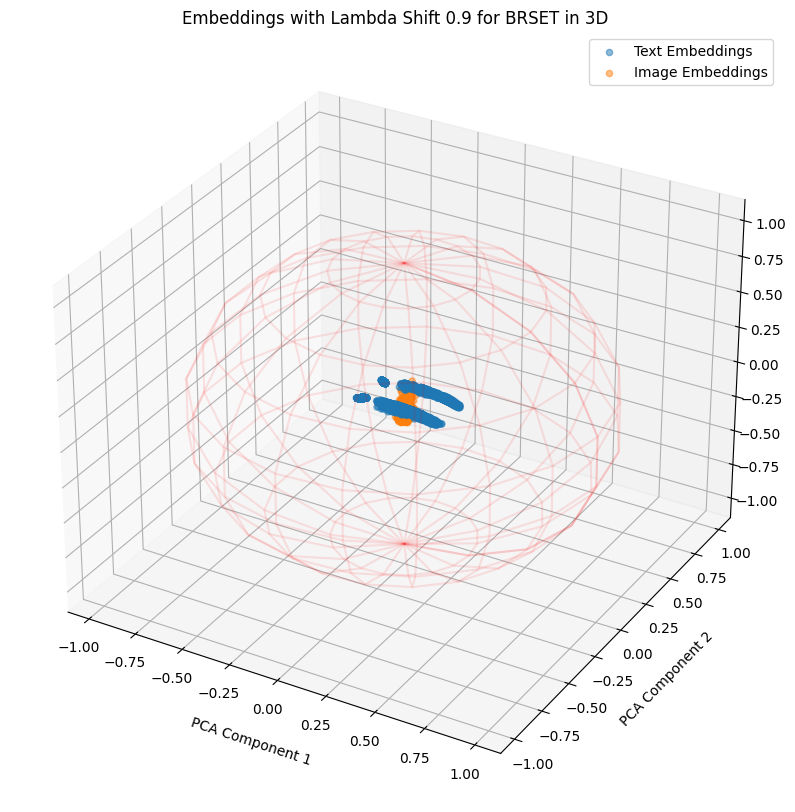

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.19 seconds
Total Training Time per Epoch: 219.14 seconds
Average Inference Time per Epoch: 0.54 seconds
Total Inference Time per Epoch: 53.96 seconds


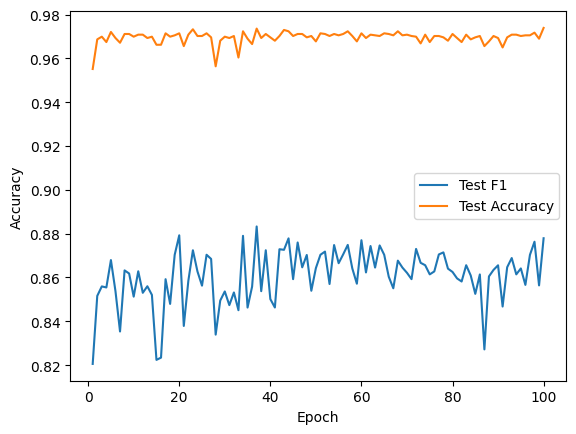

Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8779008966176972, 'Epoch': 100}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.883275383403852, 'Epoch': 37}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.52 seconds
Total Training Time per Epoch: 251.60 seconds
Average Inference Time per Epoch: 0.60 seconds
Total Inference Time per Epoch: 60.42 seconds


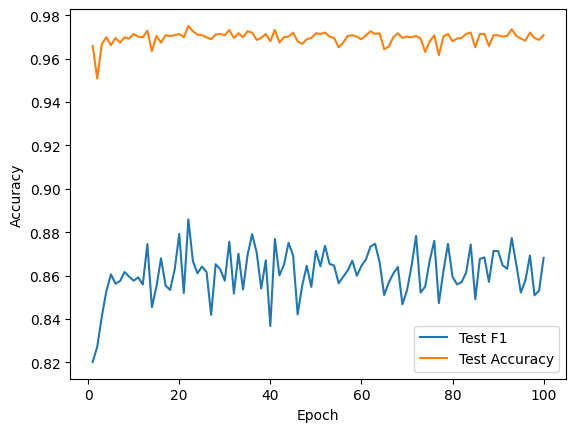

Best Accuracy: {'Acc': 0.9751075599262446, 'F1': 0.8859671703613458, 'Epoch': 22}
Best Macro-F1: {'Acc': 0.9751075599262446, 'F1': 0.8859671703613458, 'Epoch': 22}
##################################################  Shift 1  ##################################################


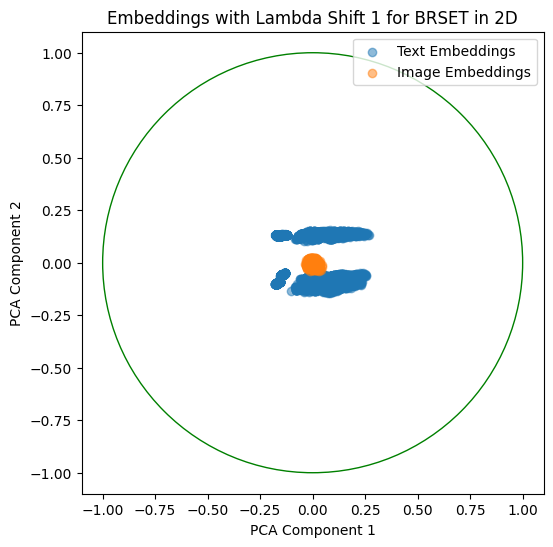

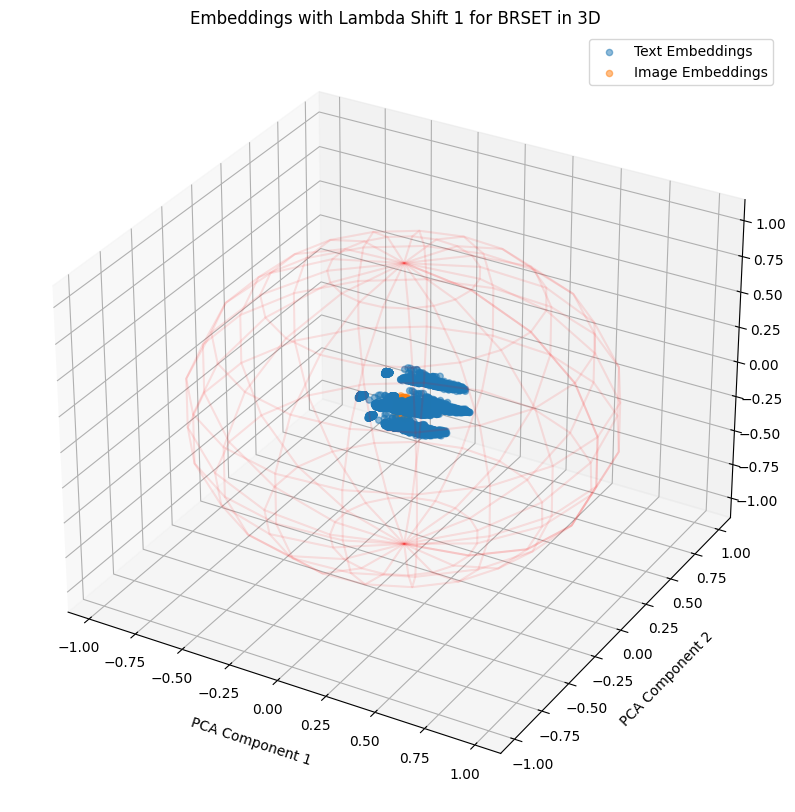

Train Shape: (13012, 1028)
Test Shape: (3254, 1028)
Training Early Fusion Model:
The number of parameters of the model are: 131585
Average Training Time per Epoch: 2.20 seconds
Total Training Time per Epoch: 220.13 seconds
Average Inference Time per Epoch: 0.55 seconds
Total Inference Time per Epoch: 54.58 seconds


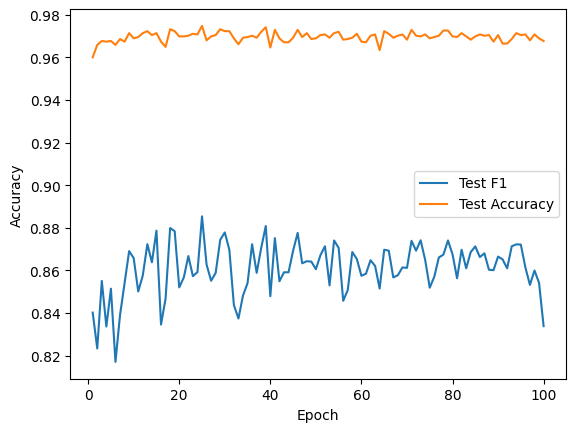

Best Accuracy: {'Acc': 0.97480024585126, 'F1': 0.8854146626357016, 'Epoch': 25}
Best Macro-F1: {'Acc': 0.97480024585126, 'F1': 0.8854146626357016, 'Epoch': 25}
Training Late Fusion Model:
The number of parameters of the model are: 66049
Average Training Time per Epoch: 2.57 seconds
Total Training Time per Epoch: 256.60 seconds
Average Inference Time per Epoch: 0.62 seconds
Total Inference Time per Epoch: 62.34 seconds


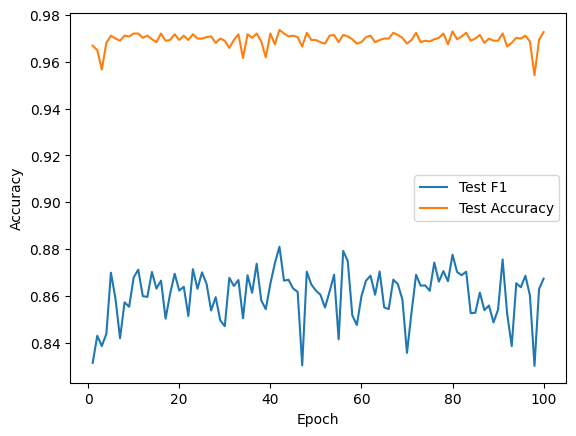

Best Accuracy: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 42}
Best Macro-F1: {'Acc': 0.9735709895513215, 'F1': 0.8809992787938166, 'Epoch': 42}


In [6]:
# Assuming df is your DataFrame
lambda_shift_values = [-1, -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]  # Negative values bring embeddings closer, positive values push them apart

# Normalize initial embeddings
df[text_columns] = normalize_embeddings(df[text_columns].values)
df[image_columns] = normalize_embeddings(df[image_columns].values)

# Dataframe with shifted values:
df_shifted = df.copy()

results = {}

for lambda_shift in lambda_shift_values:
    
    print('#'*50, f' Shift {lambda_shift} ', '#'*50)
    
    # Extract embeddings
    text_embeddings = df[text_columns].values
    image_embeddings = df[image_columns].values
    
    # Modify and normalize embeddings
    text_embeddings_shifted, image_embeddings_shifted = modify_and_normalize_embeddings(text_embeddings, image_embeddings, lambda_shift)
    
    # Update DataFrame with shifted embeddings
    df_shifted[text_columns] = text_embeddings_shifted
    df_shifted[image_columns] = image_embeddings_shifted
    
    # Visualize shifted embeddings
    visualize_embeddings(text_embeddings_shifted, image_embeddings_shifted, f'Embeddings with Lambda Shift {lambda_shift} for {DATASET}', lambda_shift, DATASET)
    
    # Split the data
    train_df, test_df = split_data(df_shifted)
    
    
    # Process and one-hot encode labels for training set
    train_labels, mlb, train_columns = process_labels(train_df, col=label_columns)
    test_labels = process_labels(test_df, col=label_columns, train_columns=train_columns)

    train_dataset = VQADataset(train_df, text_columns, image_columns, label_columns, mlb, train_columns)
    test_dataset = VQADataset(test_df, text_columns, image_columns, label_columns, mlb, train_columns)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    text_input_size = len(text_columns)
    image_input_size = len(image_columns)

    ### Models:

    # Train early fusion model
    print("Training Early Fusion Model:")
    accuracy, precision, recall, f1, best = train_early_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    
    results[f"early_({lambda_shift})"] = best
    
    # Train late fusion model
    print("Training Late Fusion Model:")
    accuracy, precision, recall, f1, best = train_late_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    
    results[f"late_({lambda_shift})"] = best

In [7]:
print('Results Early Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'early_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'early_({lambda_shift})']['Macro-F1']}")
    
print('Results Late Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'late_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'late_({lambda_shift})']['Macro-F1']}")

Results Early Fusion: 
Shift = -1
Best Accuracy: {'Acc': 0.972341733251383, 'F1': 0.8710470000792581, 'Epoch': 18}
Best F1: {'Acc': 0.9720344191763983, 'F1': 0.87736697264804, 'Epoch': 71}
Shift = -0.9
Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8710792396945772, 'Epoch': 64}
Best F1: {'Acc': 0.9714197910264291, 'F1': 0.8808549942183833, 'Epoch': 31}
Shift = -0.8
Best Accuracy: {'Acc': 0.9738783036263061, 'F1': 0.8803359195149925, 'Epoch': 100}
Best F1: {'Acc': 0.9729563614013522, 'F1': 0.8838807209685582, 'Epoch': 48}
Shift = -0.7
Best Accuracy: {'Acc': 0.97480024585126, 'F1': 0.88597737221661, 'Epoch': 31}
Best F1: {'Acc': 0.97480024585126, 'F1': 0.88597737221661, 'Epoch': 31}
Shift = -0.6
Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8756611723244674, 'Epoch': 43}
Best F1: {'Acc': 0.9726490473263676, 'F1': 0.8800622040184127, 'Epoch': 48}
Shift = -0.5
Best Accuracy: {'Acc': 0.9732636754763369, 'F1': 0.8838568019328072, 'Epoch': 17}
Best F1: {'Acc': 0.9726490473263676, 'F

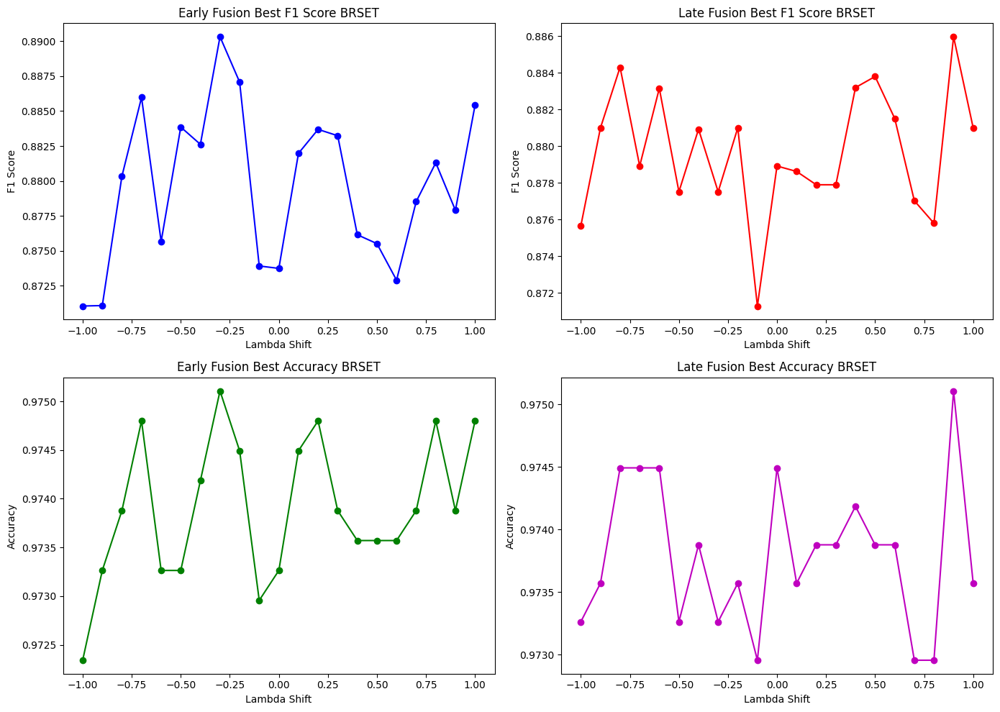

In [8]:
plot_results(results, lambda_shift_values, DATASET)